<a href="https://colab.research.google.com/github/JohnMasapantaPozo/Machine-and-Deep-Learning-Applied-to-Geosciences/blob/root/Thesis_Submition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## A. Mounting Drive into Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## B. Installing dependencies

Before running the present script make sure you install the following library dependencies in the order stated:

1. !pip install catboost
2. !pip uninstall lightgbm -y
3. ! git clone --recursive https://github.com/Microsoft/LightGBM
4. ! cd LightGBM && rm -rf build && mkdir build && cd build && cmake -DUSE_GPU=1 ../../LightGBM && make -j4 && cd ../python-package && python3 setup.py install --precompile --gpu;

In [ ]:
#1. Installing CATBOOST
!pip install catboost

In [ ]:
#2. Installing LIGHTBOOST
!pip uninstall lightgbm -y

In [ ]:
# Cloning LGBM git repository
! git clone --recursive https://github.com/Microsoft/LightGBM

In [ ]:
#4. Setting up GPU for LGBM
! cd LightGBM && rm -rf build && mkdir build && cd build && cmake -DUSE_GPU=1 ../../LightGBM && make -j4 && cd ../python-package && python3 setup.py install --precompile --gpu;

## C. Importing custom functionalitites

In [ ]:
# Custom functionalities path
import sys
sys.path.append('/content/drive/MyDrive/')

In [ ]:
# Impoting standard dependencies
import pandas as pd
import xgboost
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

In [ ]:
# Impoting customized functionalities
import module_lithopred
from module_lithopred.data_formating import formating
from module_lithopred import plotting
from module_lithopred.plotting import raw_logs, augmented_logs, litho_prediction
from module_lithopred.preprocessing import preprocess_data
from module_lithopred.augmentation import data_augmentation
from module_lithopred.input_norm import normalization
from module_lithopred.additional_functions import matrix_score, confusion_matrix

## D. Importing data

In [ ]:
# Setting datasets directories
directory = '/content/drive/MyDrive/Thesis_data/'

In [ ]:
"""Imporitng training, open test, and hidden test sets
"""
raw_training = pd.read_csv(directory + 'train.csv', sep=';') # rawtraining dataset

test_data = pd.read_csv(directory + 'test.csv', sep=';')
test_labels = pd.read_csv(directory + 'test_target.csv', sep=';')
raw_test = pd.merge(test_data, test_labels, on=['WELL', 'DEPTH_MD']) #open test dataset

raw_hidden = pd.read_csv(directory + 'hidden_test.csv', sep=';')  #hidden test dataset

In [ ]:
#Data formating

""" Calling formating function, which renames columns and maps lithofacies
classes values from 0 to 11, and drops intepretation confidence column.
"""

training_form, test_form, hidden_form = formating(raw_training, raw_test, raw_hidden)

In [ ]:
#Inspecting raw data
display(training_form.head())

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITHO
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,2
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,2
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,NaN,NaN,NaN,2
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,NaN,NaN,NaN,2
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,NaN,NaN,NaN,2


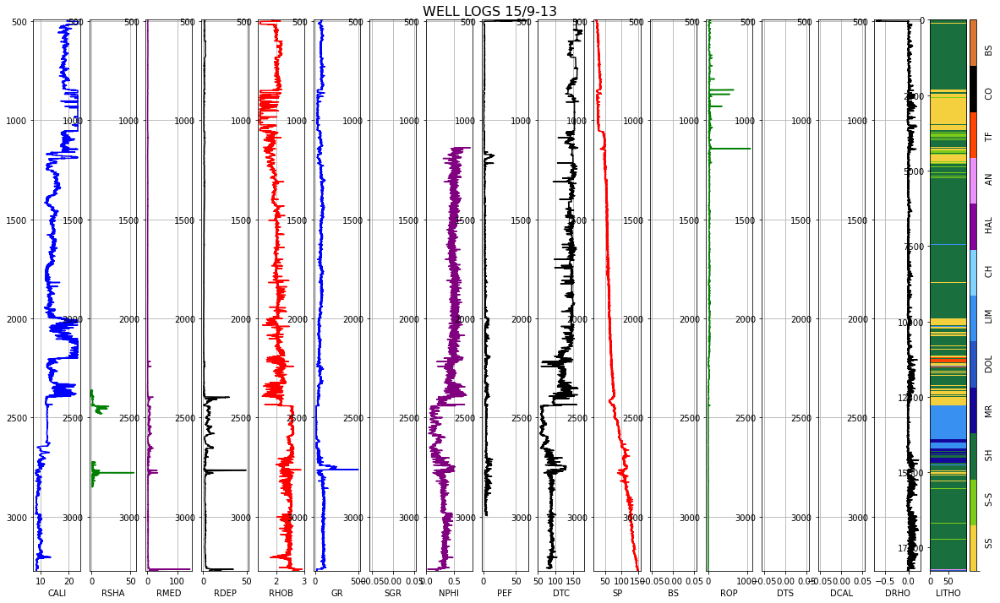

In [ ]:
""" Formated well logs visualization by calling raw_logs 
customized function. Only the fist well displayed.

For plotting additionall wells change the range(0, 1).

See raw_logs.py for further details about the function.
"""
for i in range(0, 1):
  raw_logs(training_form, i)

## E. Data Pre-processing

In [ ]:
""" Preprocessing involves dropping unncesary cols, encoding categorical variables,
and incorporating well location clustering as feature prior to feature augmentation.

See prerpocessing.py for further deatils.
"""

traindata, testdata, hiddendata = preprocess_data(training_form, test_form, hidden_form)

In [ ]:
#Checking data structure befrore augmentation
display(traindata.head())

,Cluster,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,RMIC,LITHO,GROUP_encoded,FORMATION_encoded,WELL_encoded
0,0,494.528,437641.96875,6470972.5,-469.501831,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,2,6,-1,0
1,0,494.680,437641.96875,6470972.5,-469.653809,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,2,6,-1,0
2,0,494.832,437641.96875,6470972.5,-469.805786,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,2,6,-1,0
3,0,494.984,437641.96875,6470972.5,-469.957794,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,2,6,-1,0
4,0,495.136,437641.96875,6470972.5,-470.109772,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,2,6,-1,0


## F. Feature augmentation by Machine-learning

In [ ]:
"""First, each regressor takes as training data the 80% of the features
where the log being predicted is present, later each regresor is validated
on the remanent 20% of this data, and tested on the open test set.

Second, each regression model predictcs and imputes the predicted value 
where the predicted log readings were originally missing on the training,
open, and hidden sets.

Finally, some other additional features are created.

See argumentation.py for further details.
"""

training_aug, test_aug, hidden_aug = data_augmentation(traindata, testdata, hiddendata)

-----------------------------------------PREDINCTING DTS------------------------------------------
-----------------------EXTREME BOOST REGRESSOR MODEL-----------------------
[22:15:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:185.641
Will train until validation_0-rmse hasn't improved in 100 rounds.
[100]	validation_0-rmse:18.0697
[200]	validation_0-rmse:18.2223
Stopping. Best iteration:
[143]	validation_0-rmse:16.1557

--------TRAINING SET METRICS--------
    explianed varianve 0.9429831306549395,
    maximum error 320.7644653285937, 
    root mean squared error 17.016241900143637, 
    maximum absolute error 9.933835157182124,
    R2 0.9429799629120709
-------VALIDATION SET METRICS-------
    explianed varianve 0.9425555071199461,
    maximum error 239.83959960484378, 
    root mean squared error16.92516918597536, 
    maximum absolute error 9.914570046562535,
    R2 0.9425554614781396
--

In [ ]:
# Inspecting dataframe after augmentation

display(training_aug.head())

,Cluster,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RSHA,RMED,RDEP,RHOB,GR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,RMIC,LITHO,GROUP_encoded,FORMATION_encoded,WELL_encoded,DTS_pred,DTS_COMB,NPHI_pred,NPHI_COMB,RHOB_pred,RHOB_COMB,DTC_pred,DTC_COMB,S_I,P_I,DT_R,G,K,MD_TVD
0,0,494.528,437641.96875,6470972.5,-469.501831,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,2,6,-1,0,372.100861,372.100861,0.505793,0.505793,1.849806,1.884186,168.518531,161.131180,5063.642659,11693.489697,0.433031,1.360825e+07,5.442690e+07,1.053304
1,0,494.680,437641.96875,6470972.5,-469.653809,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,2,6,-1,0,372.100861,372.100861,0.501738,0.501738,1.857824,1.889794,168.518531,160.603470,5078.713100,11766.828680,0.431613,1.364875e+07,5.506800e+07,1.053286
2,0,494.832,437641.96875,6470972.5,-469.805786,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,2,6,-1,0,374.187347,374.187347,0.499422,0.499422,1.862804,1.896523,168.518531,160.173615,5068.377575,11840.419324,0.428057,1.354503e+07,5.586237e+07,1.053269
3,0,494.984,437641.96875,6470972.5,-469.957794,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,2,6,-1,0,378.312775,378.312775,0.501374,0.501374,1.854724,1.891913,168.790010,160.149429,5000.922371,11813.422165,0.423325,1.321902e+07,5.613964e+07,1.053252
4,0,495.136,437641.96875,6470972.5,-470.109772,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,2,6,-1,0,378.312775,378.312775,0.501374,0.501374,1.862377,1.880034,168.875985,160.128342,4969.523143,11740.795349,0.423270,1.313602e+07,5.580647e+07,1.053235


In [ ]:
"""Concatenating the actual, predited, and augmented well logs for plotting
"""

cols_needed = ['DTS', 'DTS_pred', 'DTS_COMB', 'NPHI', 'NPHI_pred', 'NPHI_COMB', 'RHOB',
               'RHOB_pred', 'RHOB_COMB', 'DTC', 'DTC_pred', 'DTC_COMB', 'LITHO']

train_predicted_logs = pd.concat((raw_training[['WELL', 'DEPTH_MD']],
                                  training_aug[cols_needed].reset_index()), axis=1)

test_predicted_logs = pd.concat((raw_test[['WELL', 'DEPTH_MD']],
                                 test_aug[cols_needed].reset_index()), axis=1)

hidden_predicted_logs = pd.concat((raw_hidden[['WELL', 'DEPTH_MD']],
                                   hidden_aug[cols_needed].reset_index()), axis=1)

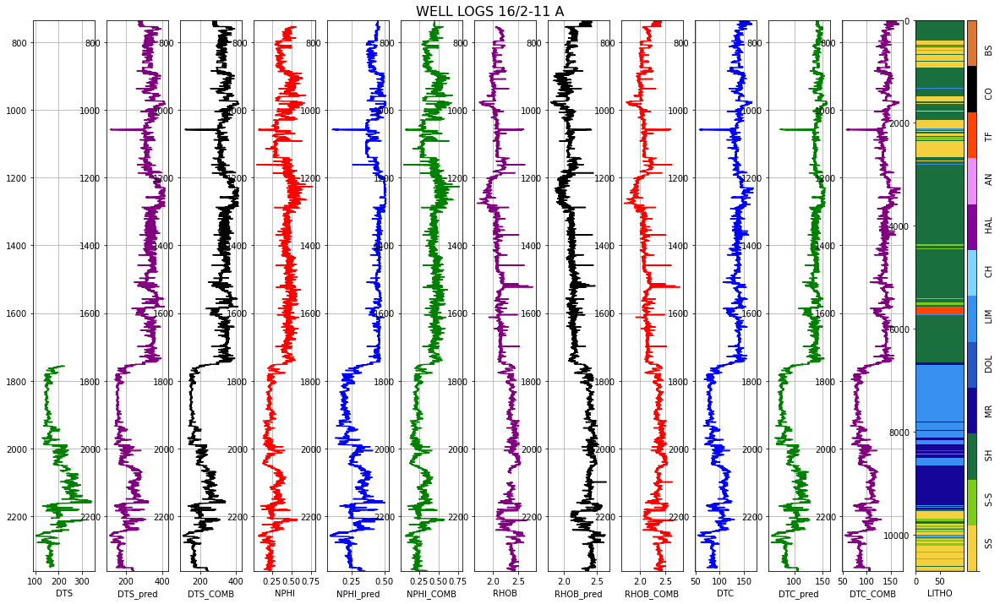

In [ ]:
""" Actual, predicted, and augmented well logs visualization by calling 
augmented_logs customized function. Only the fist well displayed.

For plotting additionall wells change the range(0, 1).

See augmented_logs.py for further details about the function.
"""

for i in range(10, 11):
  augmented_logs(train_predicted_logs, i)

## G. Data Normalization

In [ ]:
"""First, the features that were not augmented by machine-learning
are inputed by median inputation technique before normalizing

Later, a Standard Scaler is used to standardize the datasets.

See normalization.py for further details.
"""

train_norm, test_norm, hidden_norm = normalization(training_aug, test_aug, hidden_aug)

## H. Machine learning models' results

#### A1. LOGISTIC REGRESSION MODEL (LR)

In [ ]:
"""Predicting lithofacies by using the Logistic Regression model
(LR) by calling run_LR function.

See LR_model.py for further details about the function.
"""

from module_lithopred.ML_models.LR_model import run_LR
train_pred_lr, test_pred_lr, hidden_pred_lr = run_LR(train_norm, test_norm, hidden_norm)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 1335 epochs took 201 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  3.4min finished


In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_lr))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_lr))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.6811666135607899
Hidden set report:               precision    recall  f1-score   support

           0       0.62      0.66      0.64     14045
           1       0.38      0.08      0.14     12283
           2       0.83      0.97      0.89     71827
           3       0.34      0.10      0.16      4396
           4       0.00      0.00      0.00       287
           5       0.35      0.51      0.42      8374
           6       0.77      0.30      0.43      2905
           7       0.99      0.98      0.99      6498
           8       0.97      0.31      0.47       597
           9       0.00      0.00      0.00       941
          10       0.95      0.43      0.60       244

    accuracy                           0.75    122397
   macro avg       0.57      0.40      0.43    122397
weighted avg       0.71      0.75      0.71    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing LR predctions into a copy of the formated datasets.
"""
train_lr_res = training_form.copy()
test_lr_res = test_form.copy()
hidden_lr_res = hidden_form.copy()

#Appending predictions to a copy of the augmented datasets
train_lr_res['LR_TM'] = train_pred_lr
test_lr_res['LR_TM'] = test_pred_lr
hidden_lr_res['LR_TM'] = hidden_pred_lr

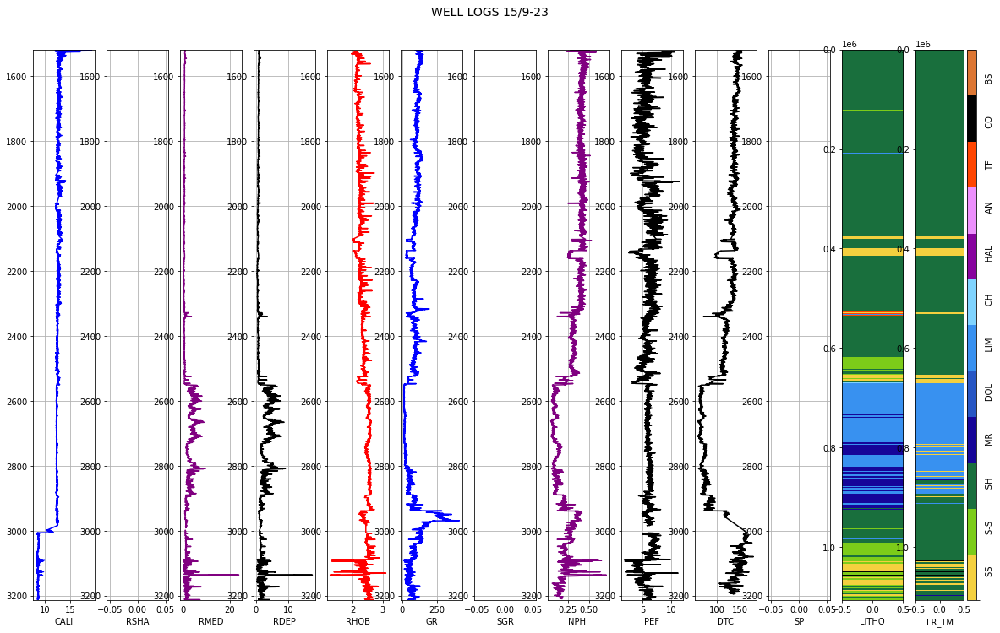

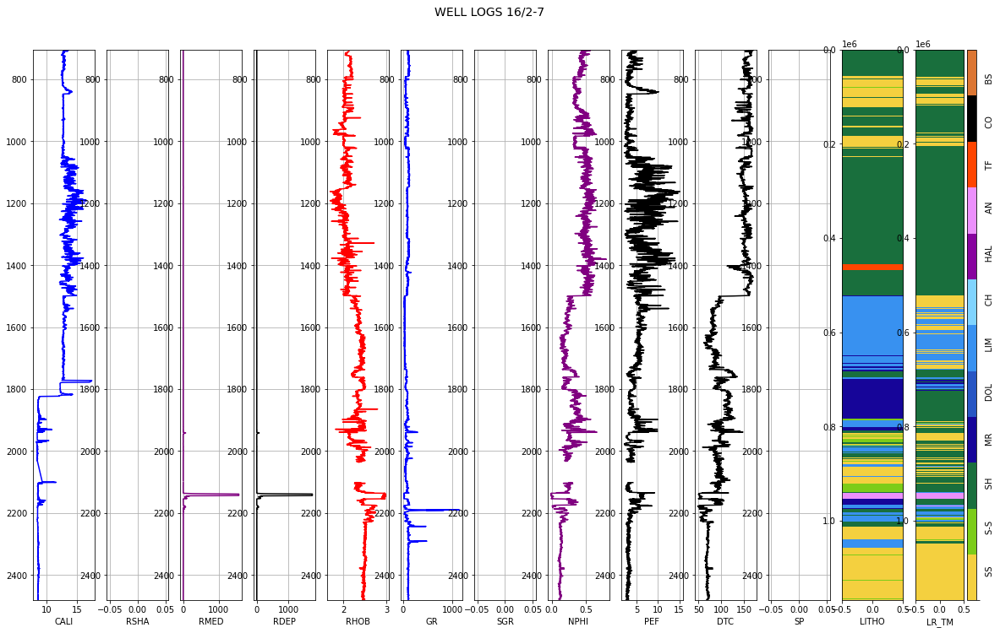

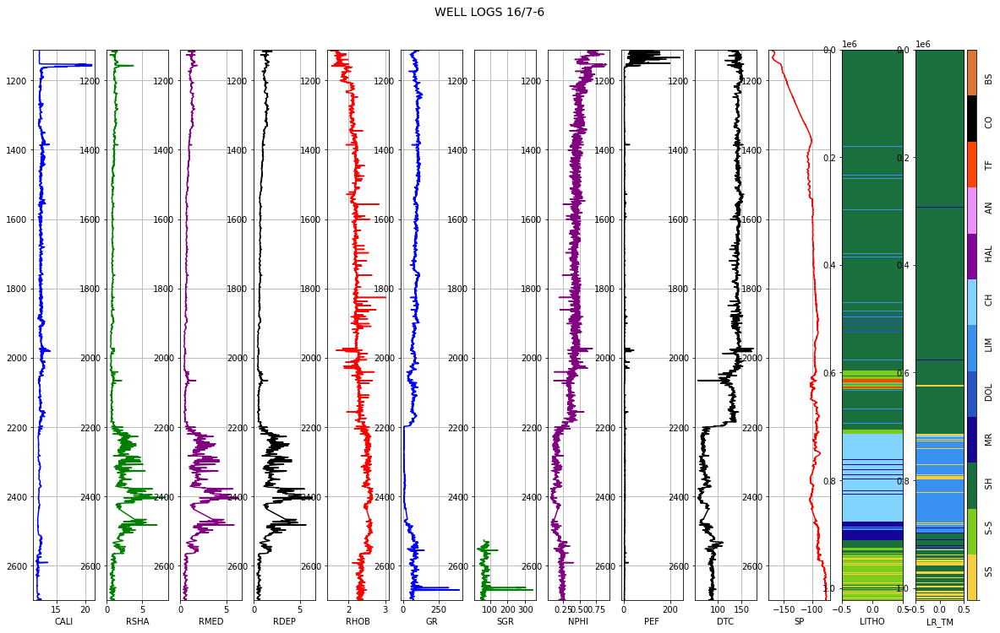

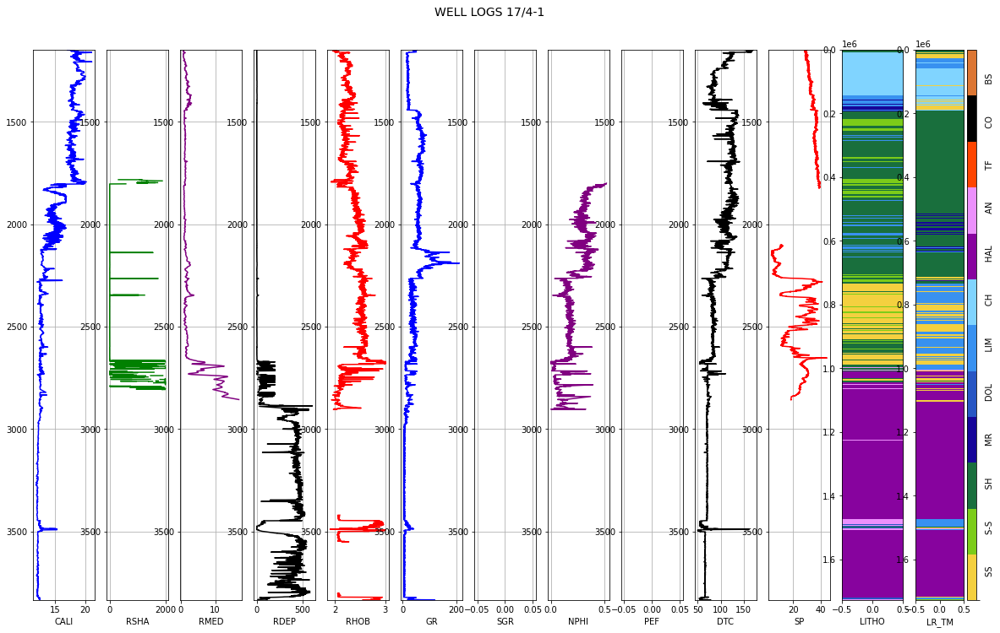

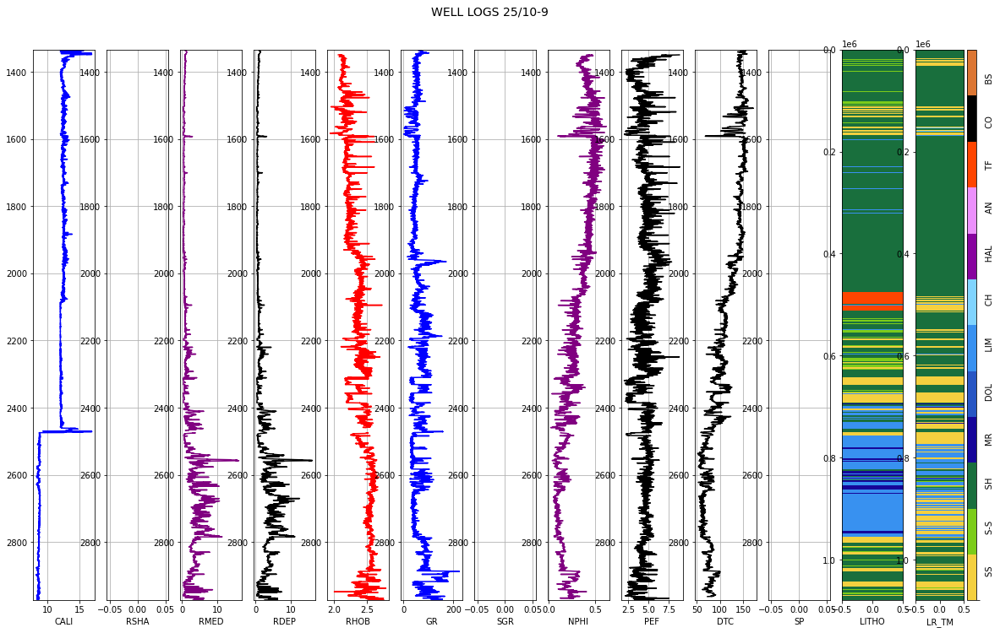

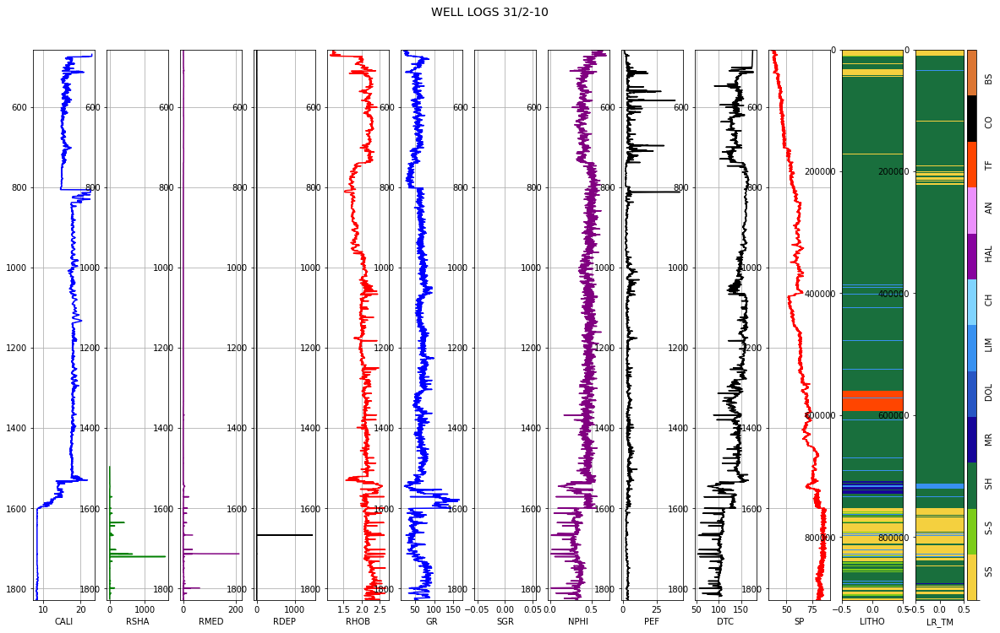

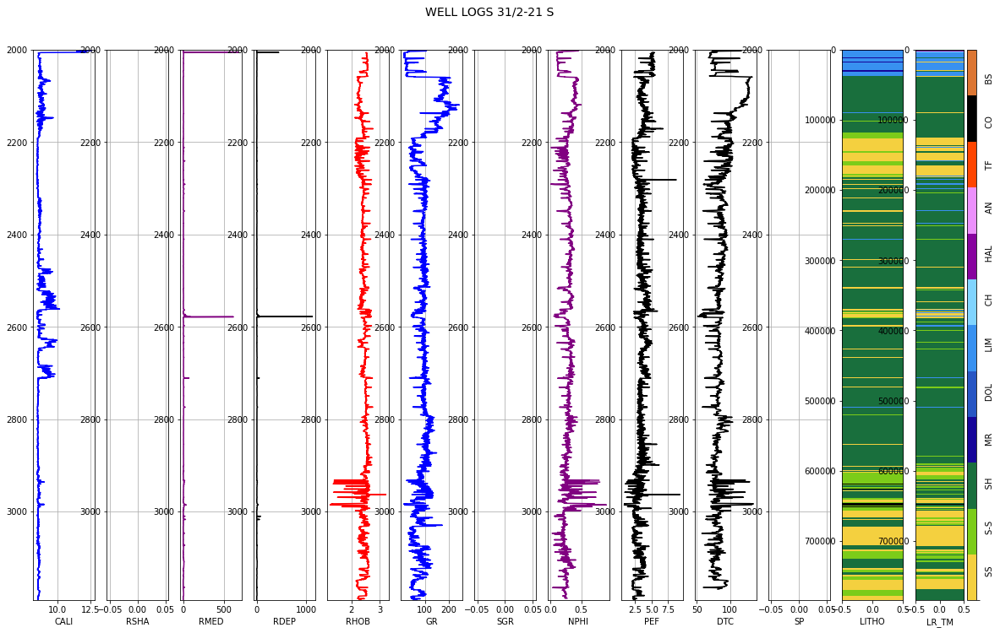

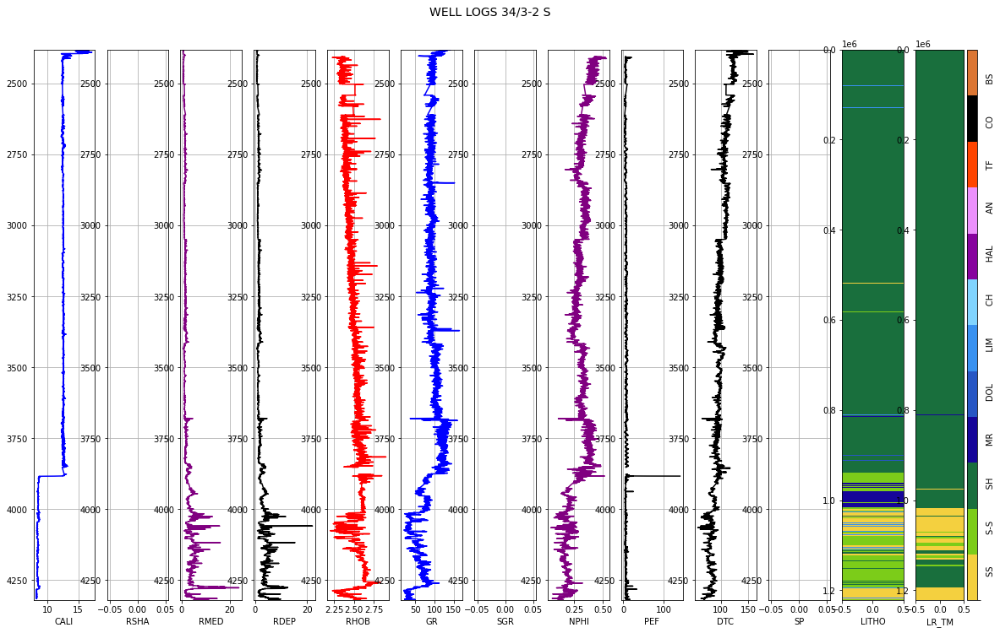

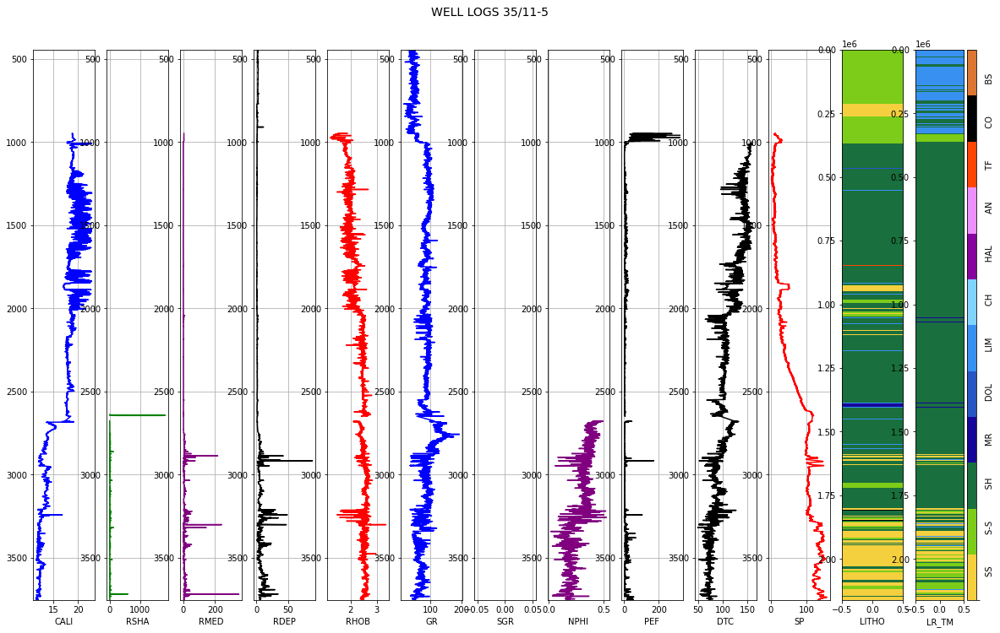

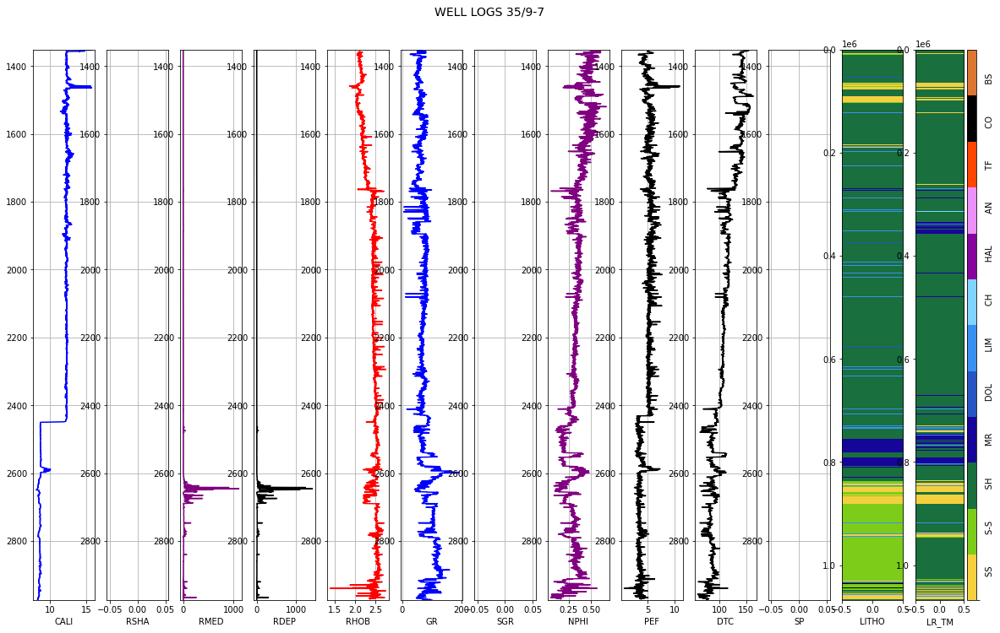

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_lr_res, i, 1)

#### A2. K-NEAREST NEIGHBOR MODEL (KNN)

In [ ]:
"""Predicting lithofacies by using the K-Nearest Neighbor model
(KNN) by calling run_KNN function.

See KNN_model.py for further details about the function.
"""

from module_lithopred.ML_models.KNN_model import run_KNN
train_pred_knn, test_pred_knn, hidden_pred_knn = run_KNN(train_norm, test_norm, hidden_norm)

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_knn))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_knn))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.5614353292972867
Hidden set report:               precision    recall  f1-score   support

           0       0.75      0.68      0.72     14045
           1       0.48      0.27      0.35     12283
           2       0.84      0.94      0.89     71827
           3       0.68      0.28      0.40      4396
           4       0.00      0.00      0.00       287
           5       0.53      0.64      0.58      8374
           6       0.69      0.46      0.55      2905
           7       0.98      1.00      0.99      6498
           8       0.97      0.43      0.59       597
           9       0.50      0.46      0.48       941
          10       0.93      0.36      0.51       244

    accuracy                           0.78    122397
   macro avg       0.67      0.50      0.55    122397
weighted avg       0.76      0.78      0.76    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing KNN predctions into a copy of the formated datasets.
"""
train_knn_res = training_form.copy()
test_knn_res = test_form.copy()
hidden_knn_res = hidden_form.copy()

#Appending predictions to a copy of the augmented datasets
train_knn_res['KNN_TM'] = train_pred_knn
test_knn_res['KNN_TM'] = test_pred_knn
hidden_knn_res['KNN_TM'] = hidden_pred_knn

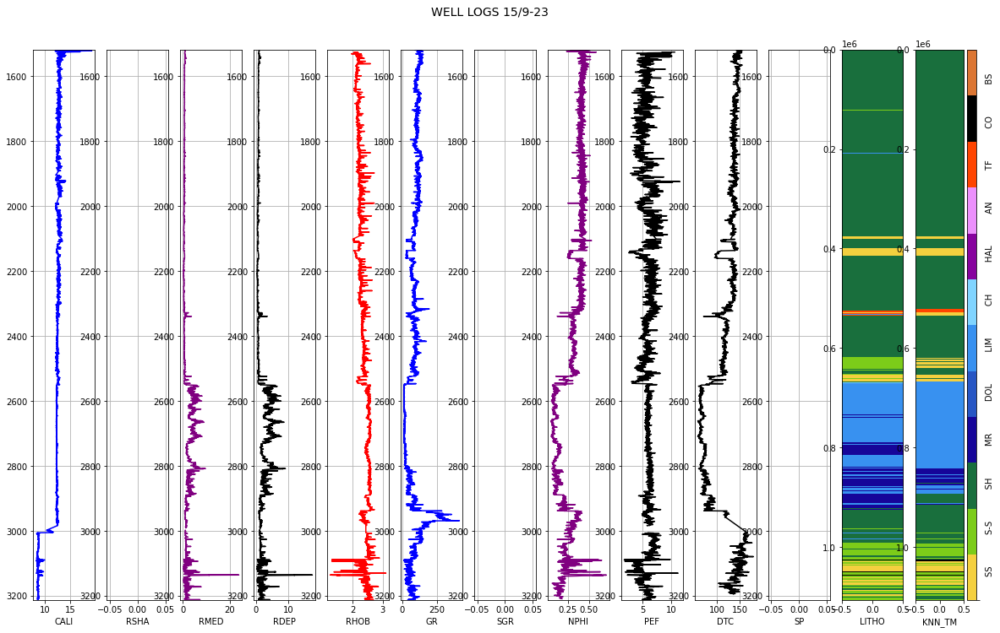

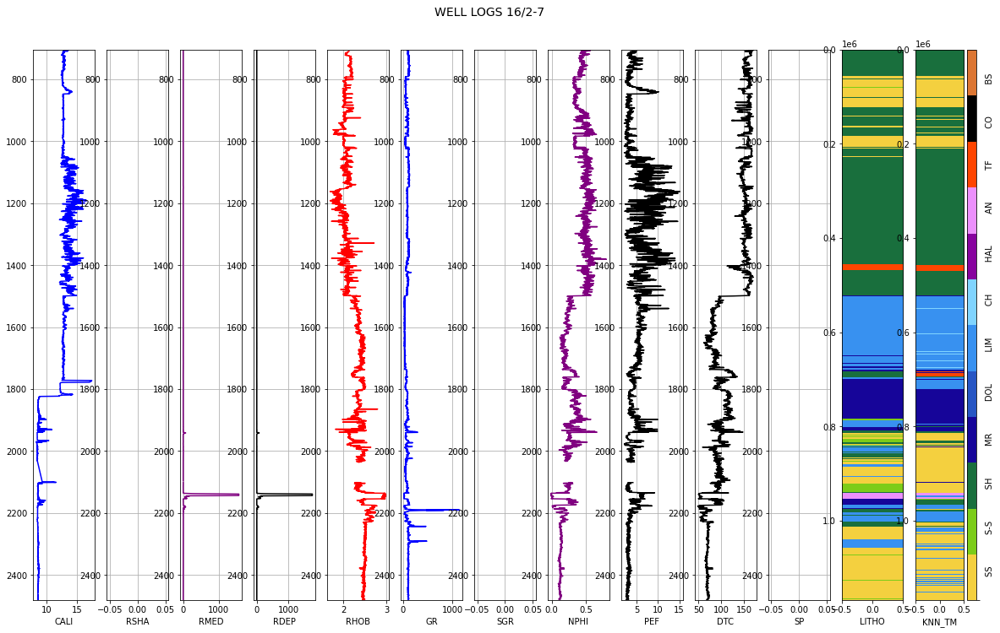

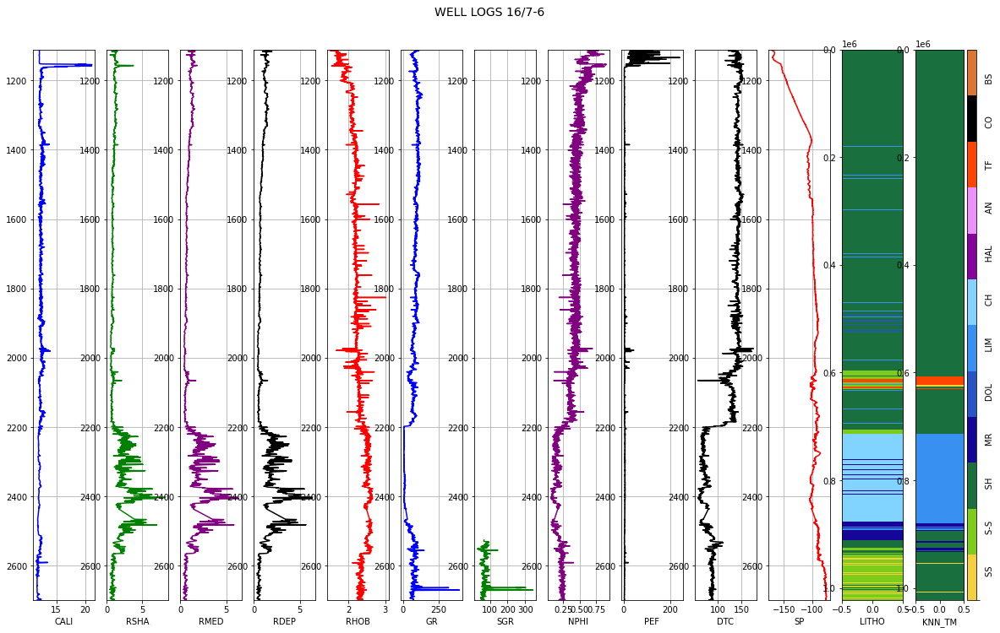

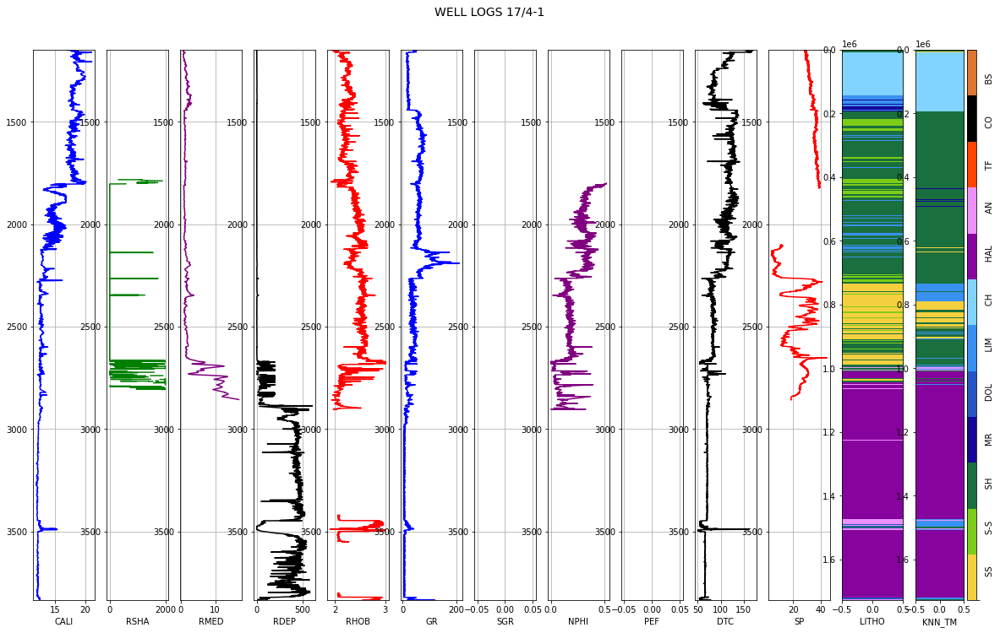

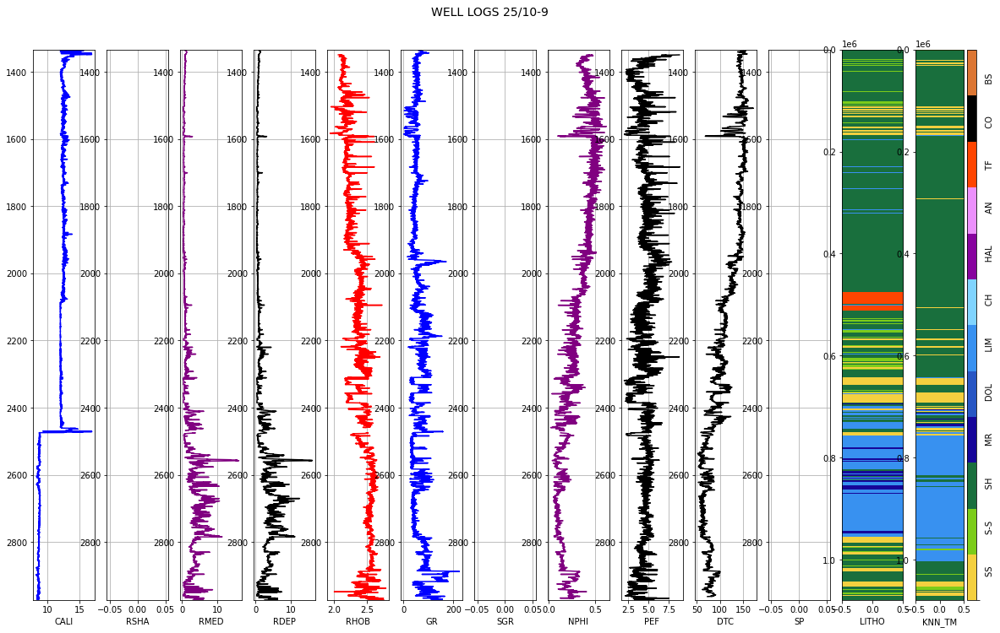

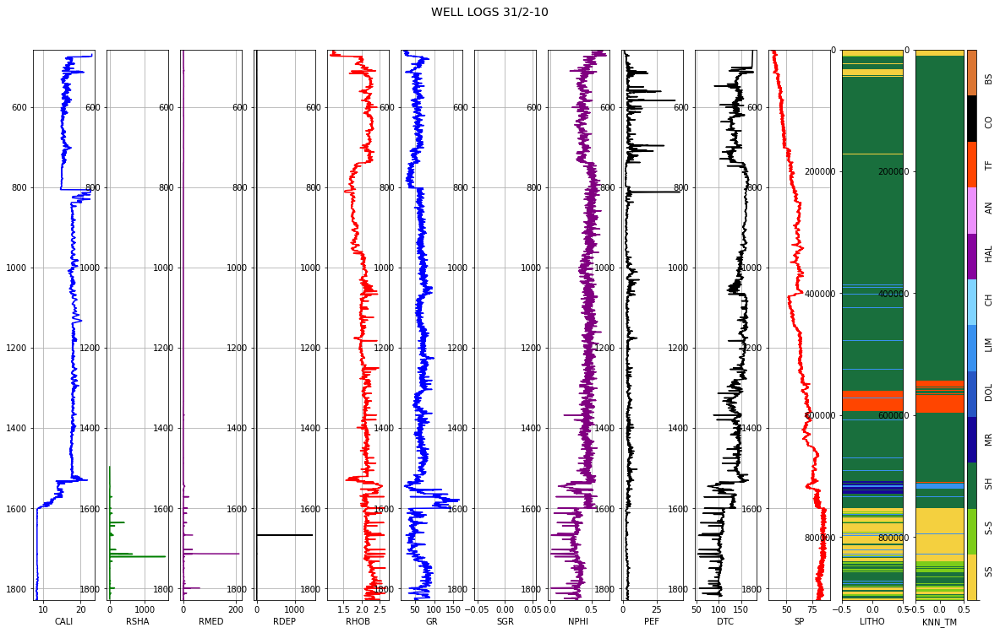

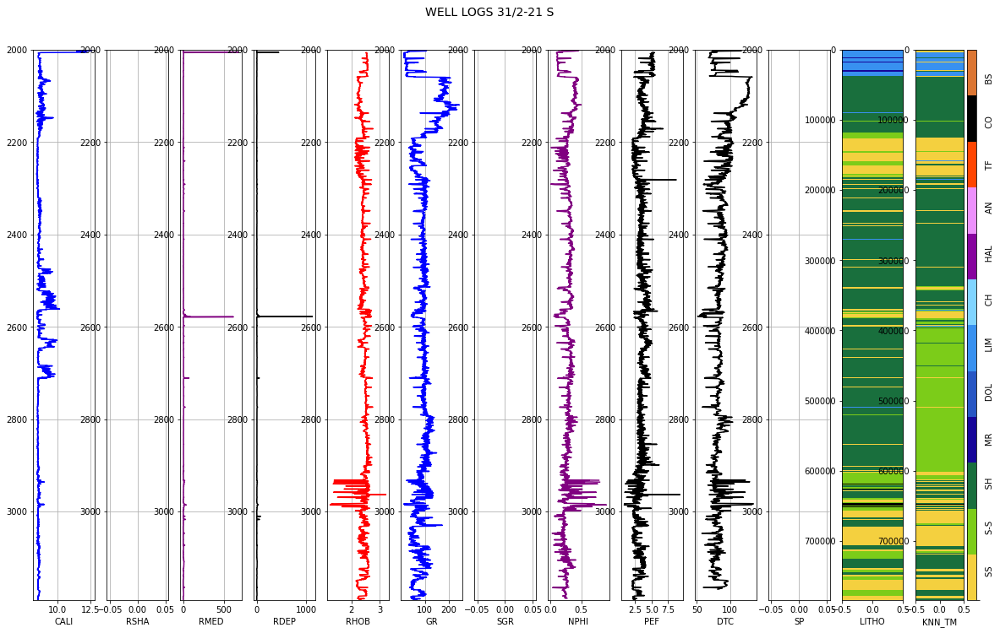

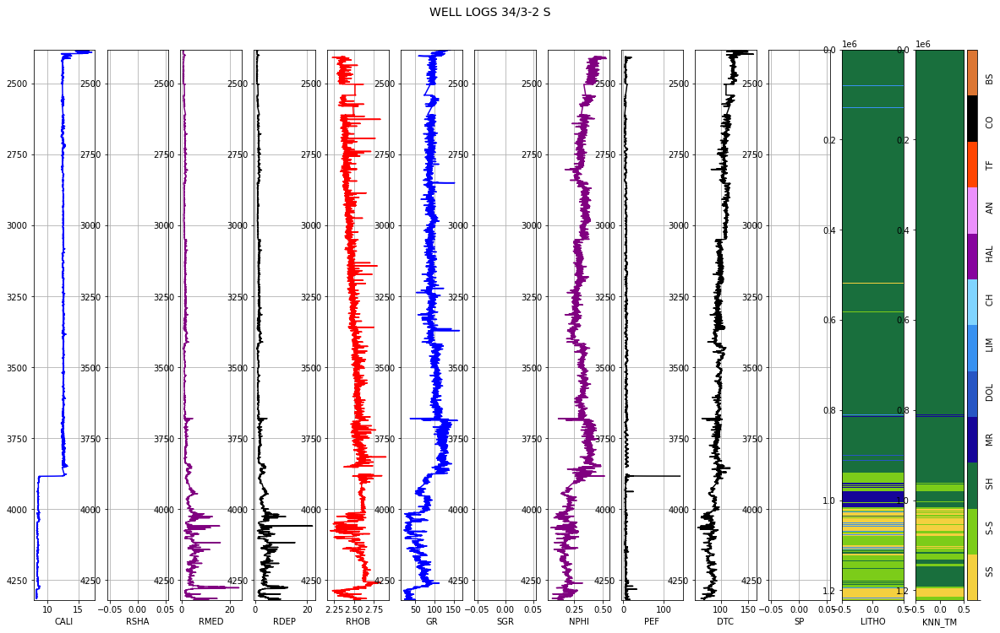

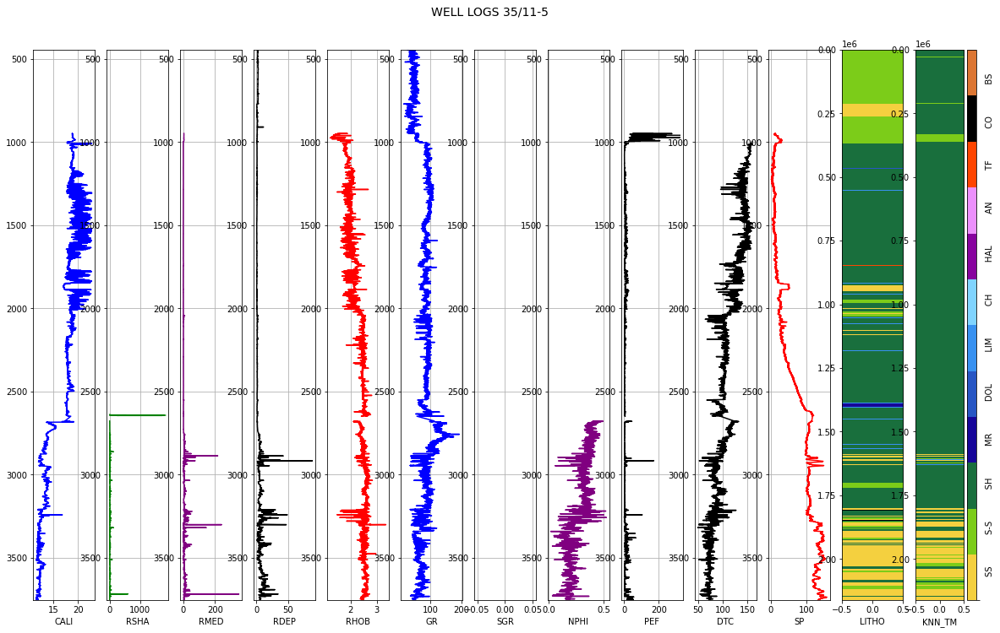

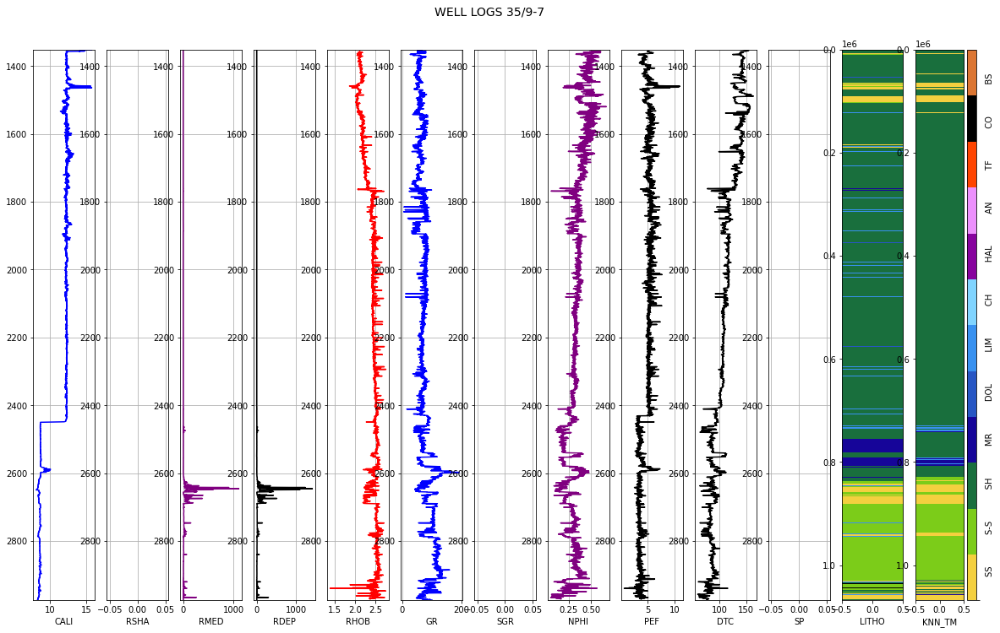

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_knn_res, i, 1)

#### A3. SUPPORT VECTOR MACHINES

In [ ]:
"""Predicting lithofacies by using the Support Vector Machines model
(SVM) by calling run_SVM function.

See SVM_model.py for further details about the function.
"""

from module_lithopred.ML_models.SVM_model import run_SVM
train_pred_svm, test_pred_svm, hidden_pred_svm = run_SVM(train_norm, test_norm, hidden_norm)

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""
 
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_svm))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_svm))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.6331068163435378
Hidden set report:               precision    recall  f1-score   support

           0       0.65      0.79      0.71     14045
           1       0.38      0.21      0.27     12283
           2       0.85      0.86      0.86     71827
           3       0.14      0.24      0.18      4396
           4       0.00      0.00      0.00       287
           5       0.60      0.66      0.63      8374
           6       0.68      0.46      0.55      2905
           7       0.99      0.96      0.98      6498
           8       0.93      0.17      0.29       597
           9       0.54      0.60      0.57       941
          10       0.87      0.41      0.55       244

    accuracy                           0.74    122397
   macro avg       0.60      0.49      0.51    122397
weighted avg       0.74      0.74      0.73    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing SVM predctions into a copy of the formated datasets.
"""
train_svm_res = training_form.copy()
test_svm_res = test_form.copy()
hidden_svm_res = hidden_form.copy()

train_svm_res['SVM_TM'] = train_pred_svm
test_svm_res['SVM_TM'] = test_pred_svm
hidden_svm_res['SVM_TM'] = hidden_pred_svm

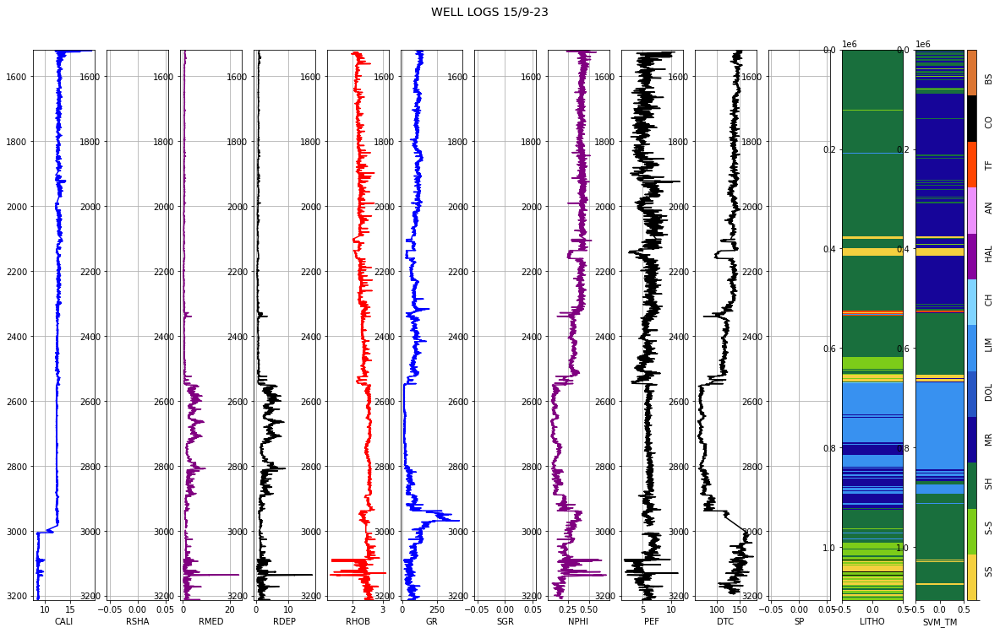

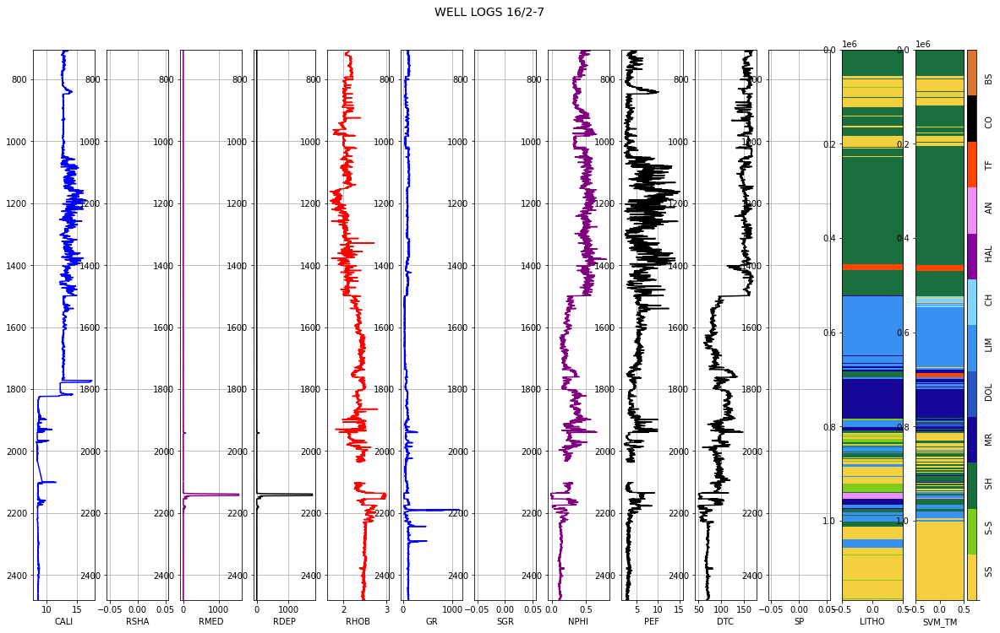

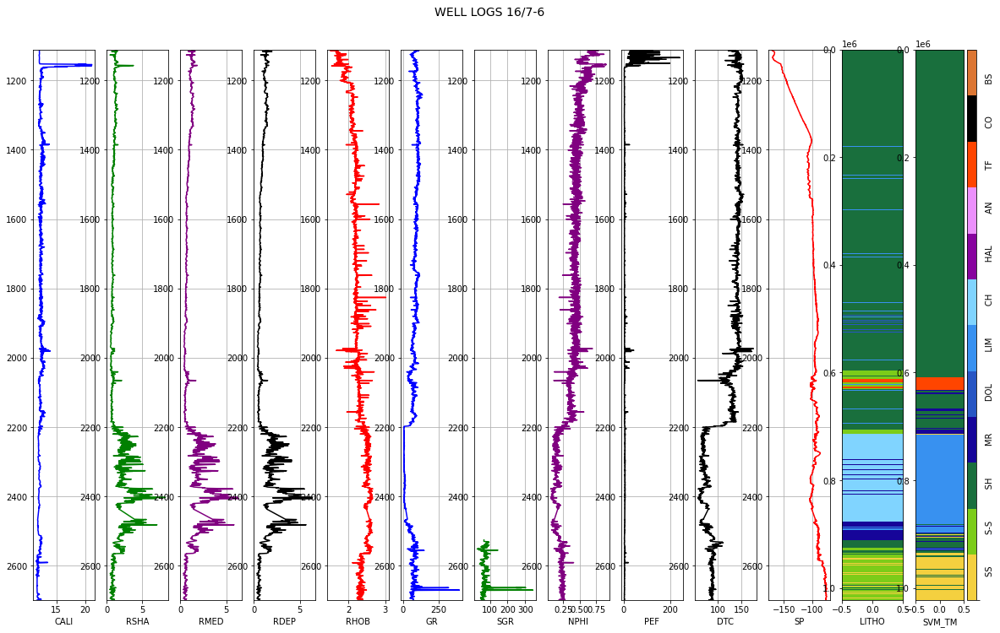

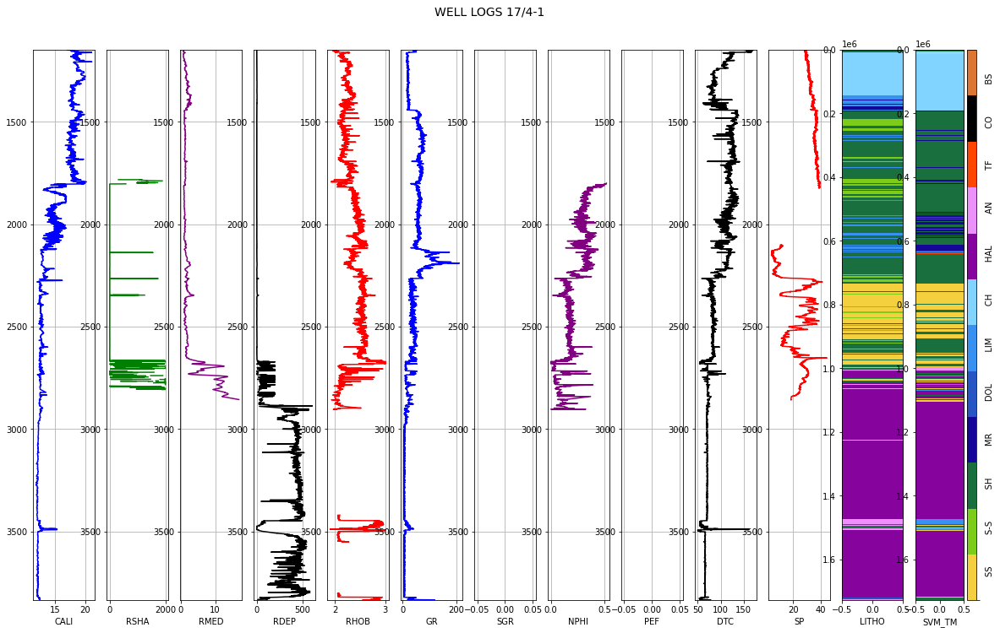

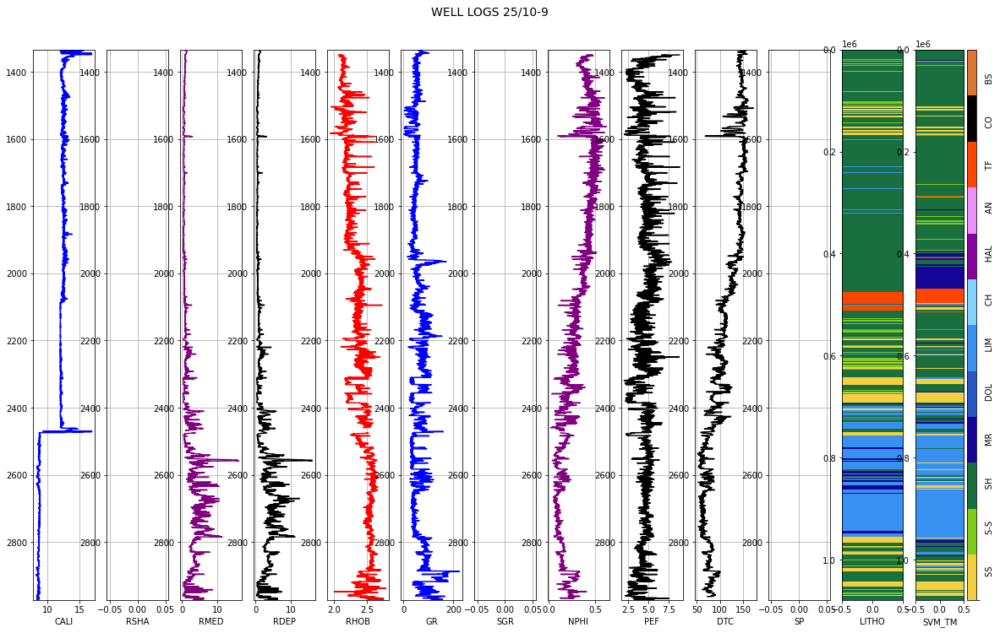

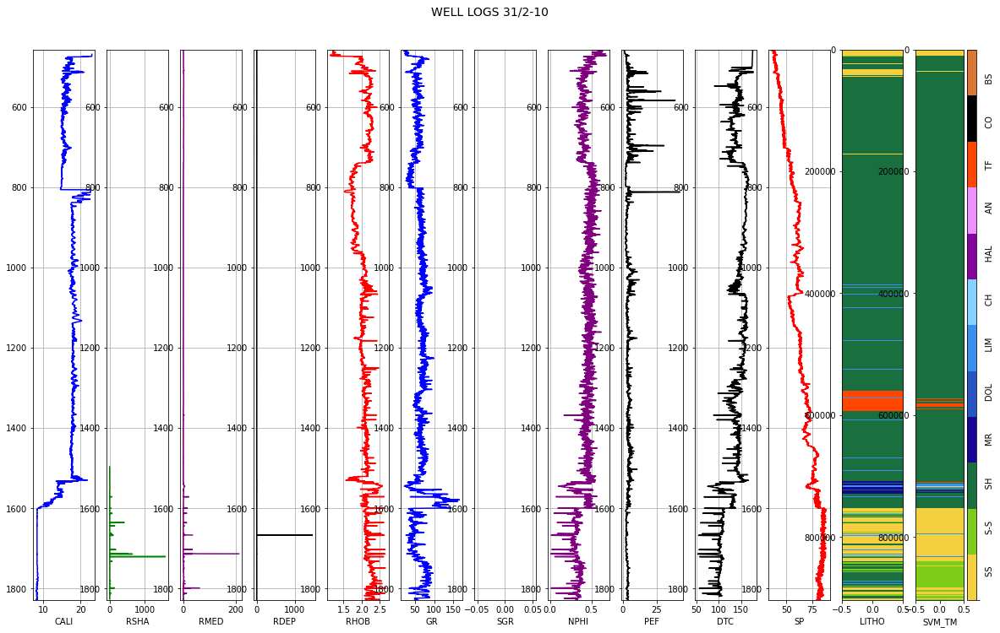

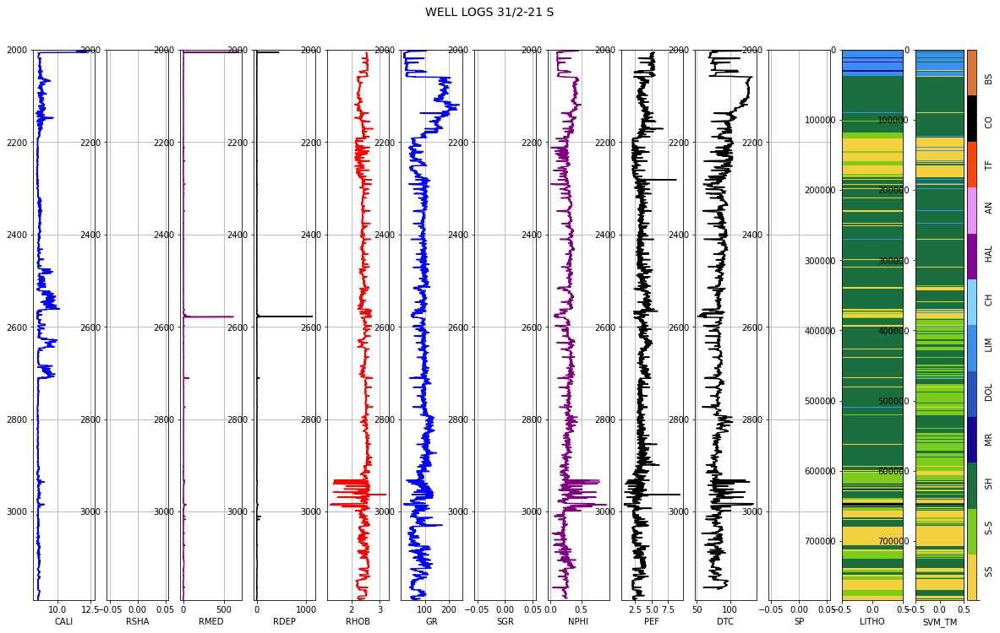

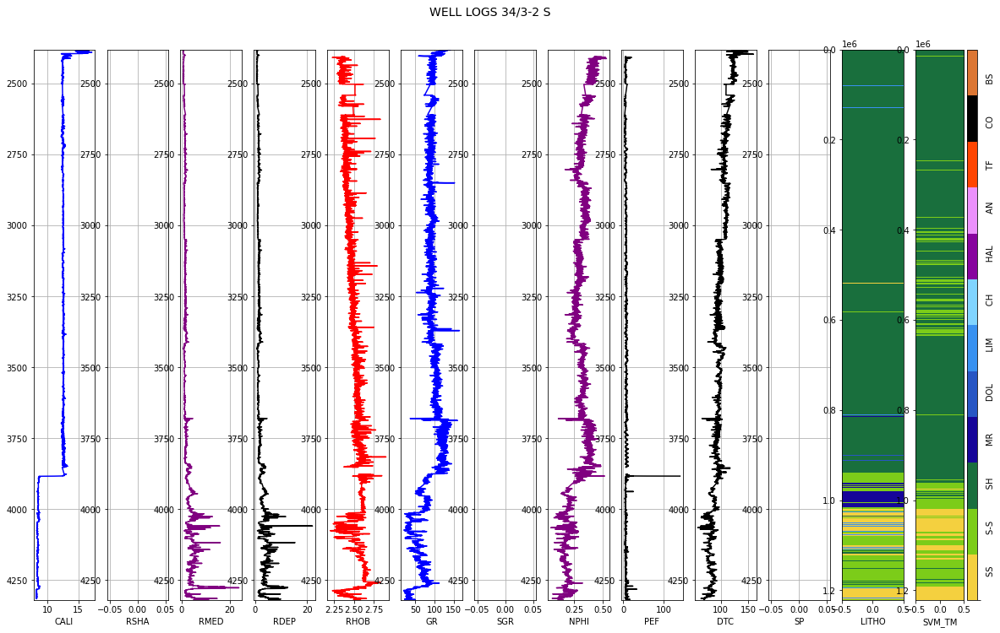

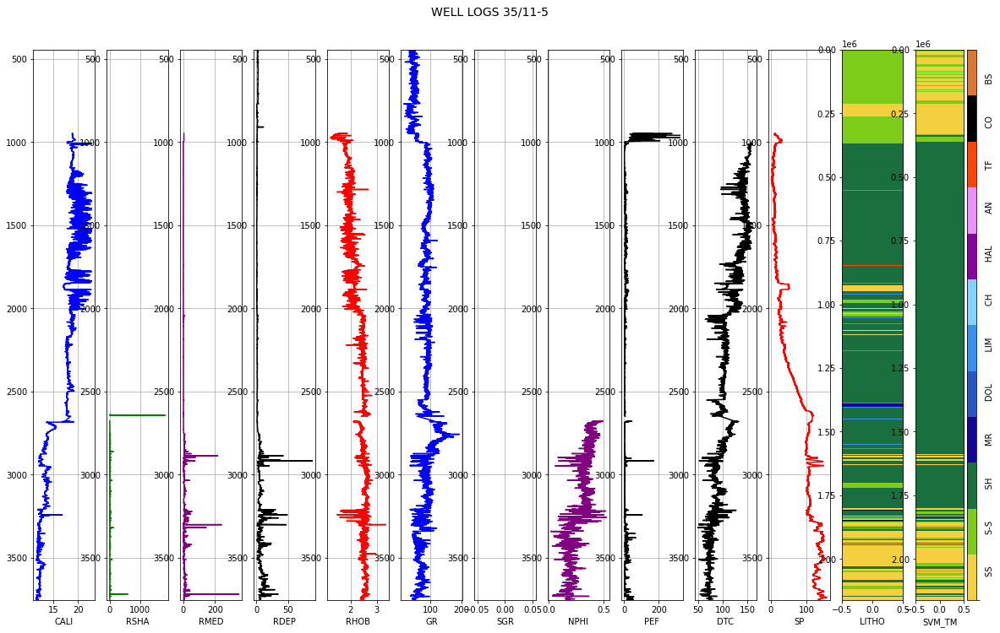

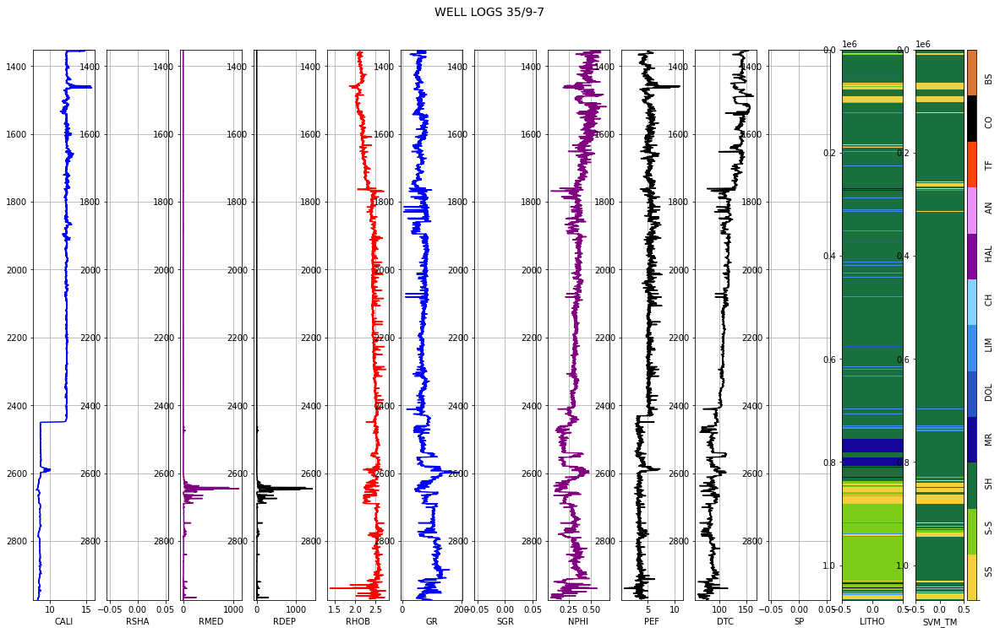

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_svm_res, i, 1)

#### A4. DECISION TREES

In [ ]:
"""Predicting lithofacies by using the Decision Tree model
(DT) by calling run_DT function.

See DT_model.py for further details about the function.
"""

from module_lithopred.ML_models.DT_model import run_DT
train_pred_dt, open_pred_dt, hidden_pred_dt = run_DT(train_norm, test_norm, hidden_norm)

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_dt))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_dt))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.7057342091717934
Hidden set report:               precision    recall  f1-score   support

           0       0.60      0.53      0.56     14045
           1       0.95      0.09      0.17     12283
           2       0.75      0.98      0.85     71827
           3       0.44      0.01      0.02      4396
           4       0.00      0.00      0.00       287
           5       0.62      0.61      0.62      8374
           6       0.00      0.00      0.00      2905
           7       0.87      1.00      0.93      6498
           8       0.00      0.00      0.00       597
           9       0.00      0.00      0.00       941
          10       0.00      0.00      0.00       244

    accuracy                           0.74    122397
   macro avg       0.39      0.29      0.29    122397
weighted avg       0.71      0.74      0.67    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing DT predctions into a copy of the formated datasets.
"""
train_dt_res = training_form.copy()
test_dt_res = test_form.copy()
hidden_dt_res = hidden_form.copy()

train_dt_res['DT_TM'] = train_pred_dt
test_dt_res['DT_TM'] = open_pred_dt
hidden_dt_res['DT_TM'] = hidden_pred_dt

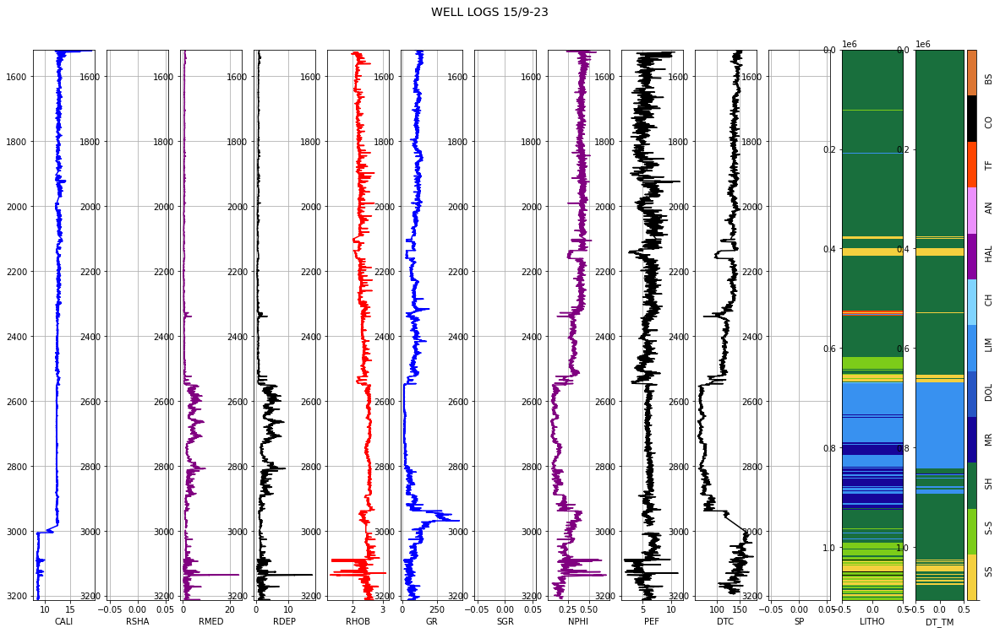

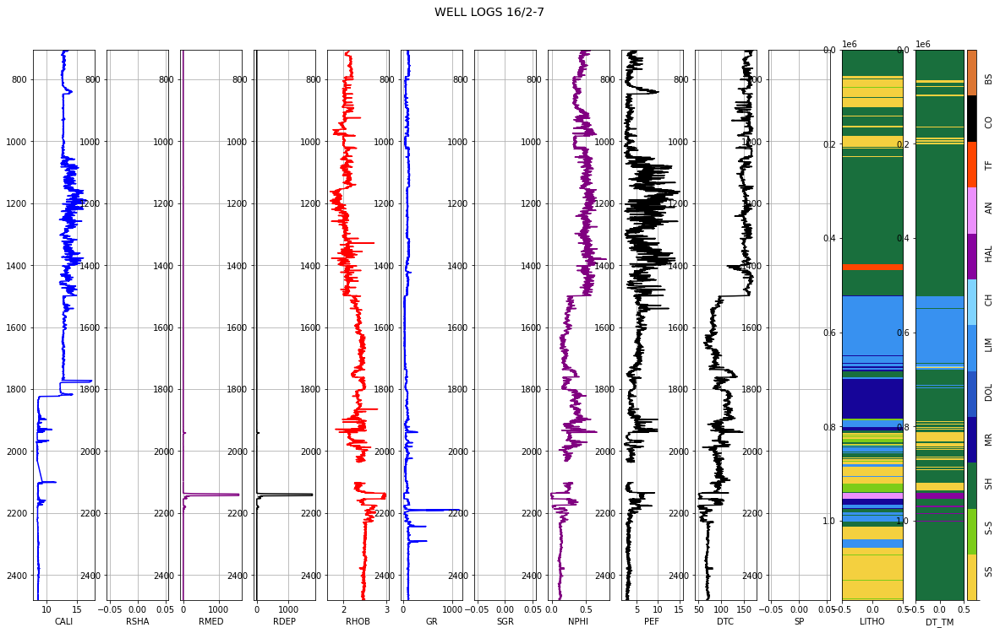

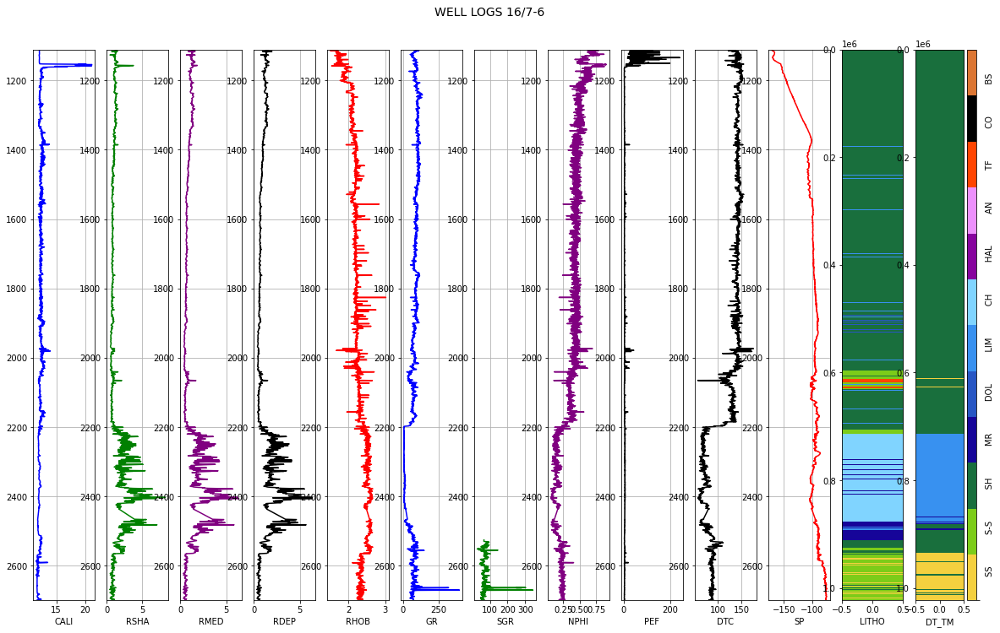

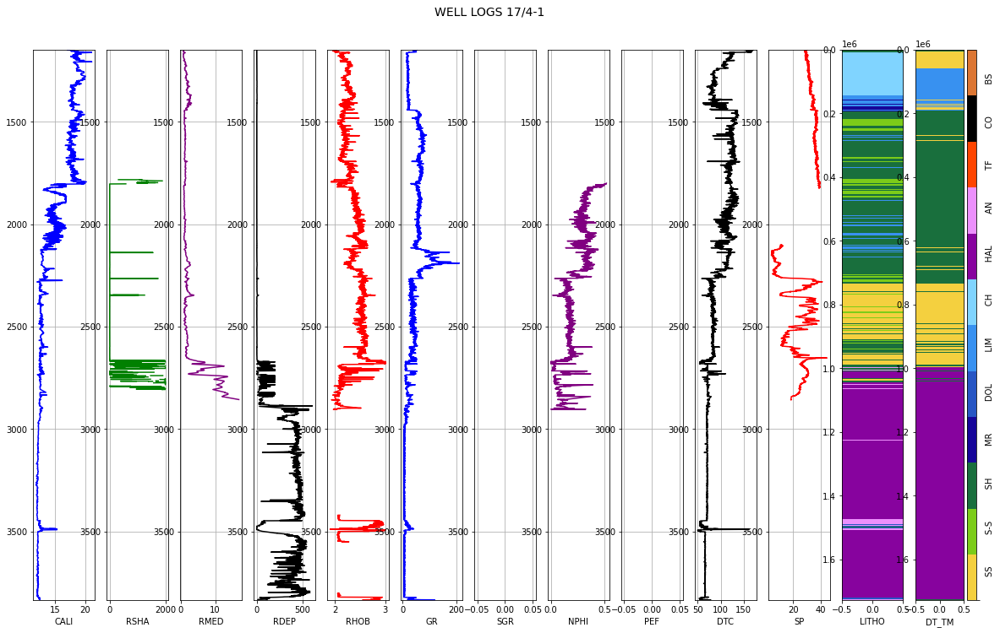

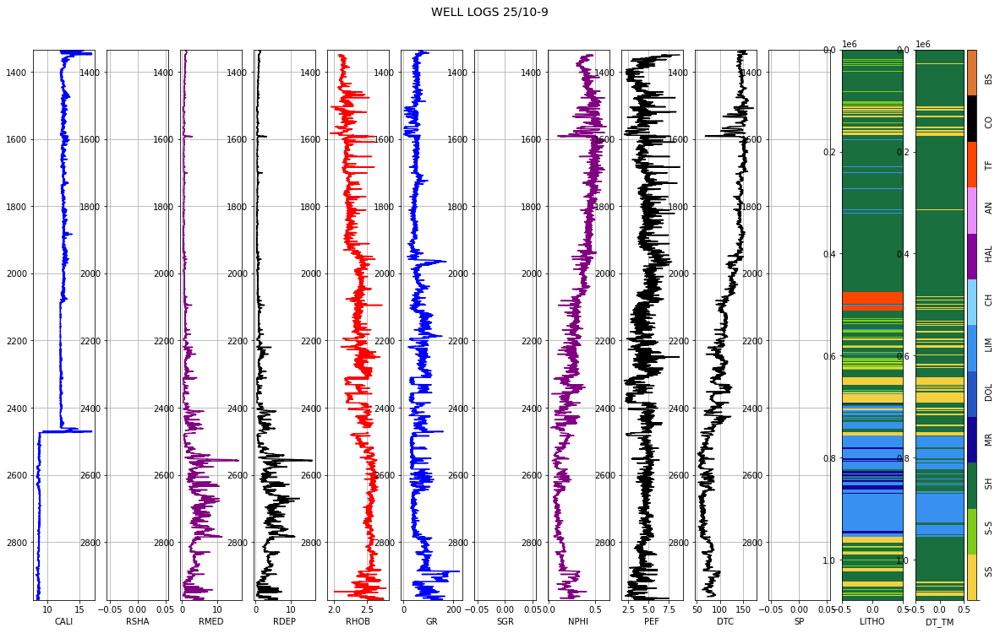

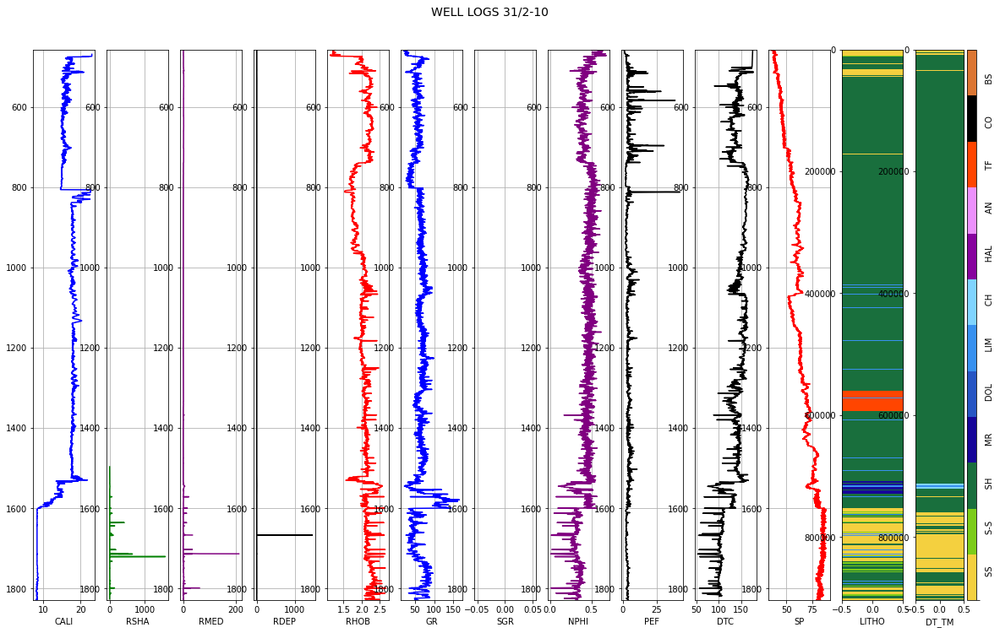

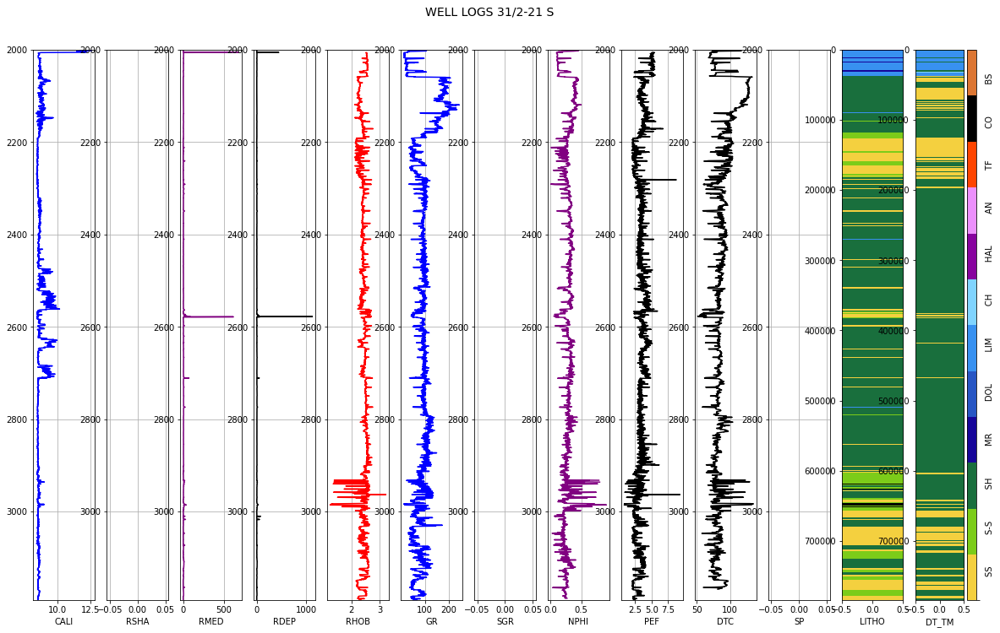

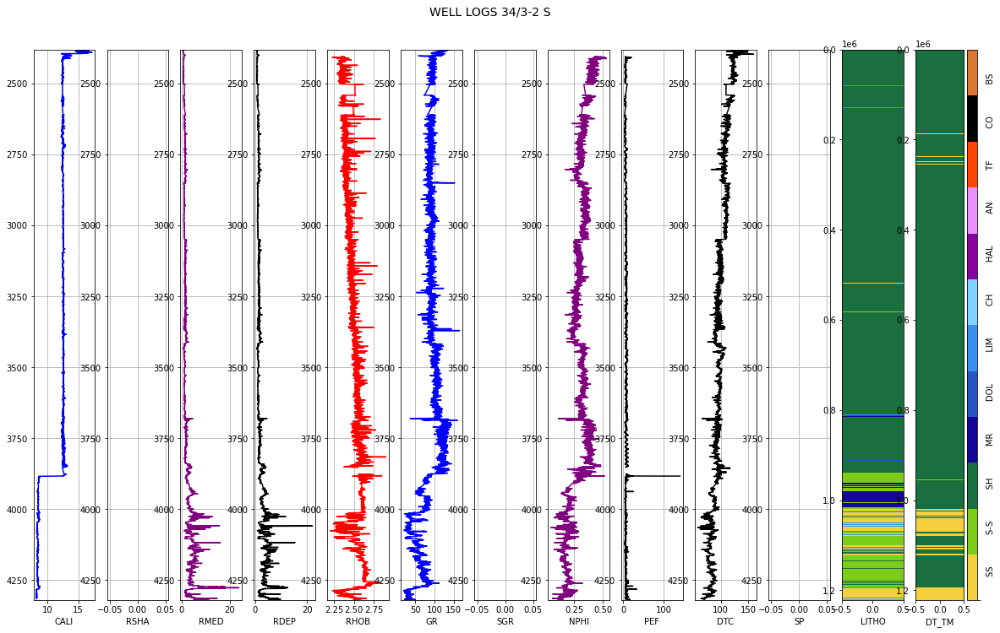

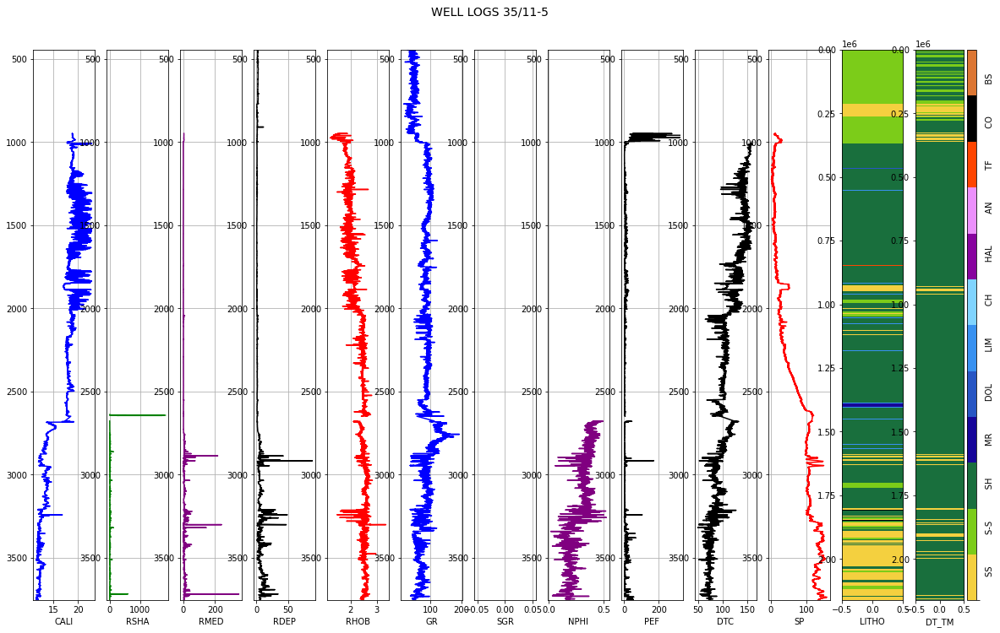

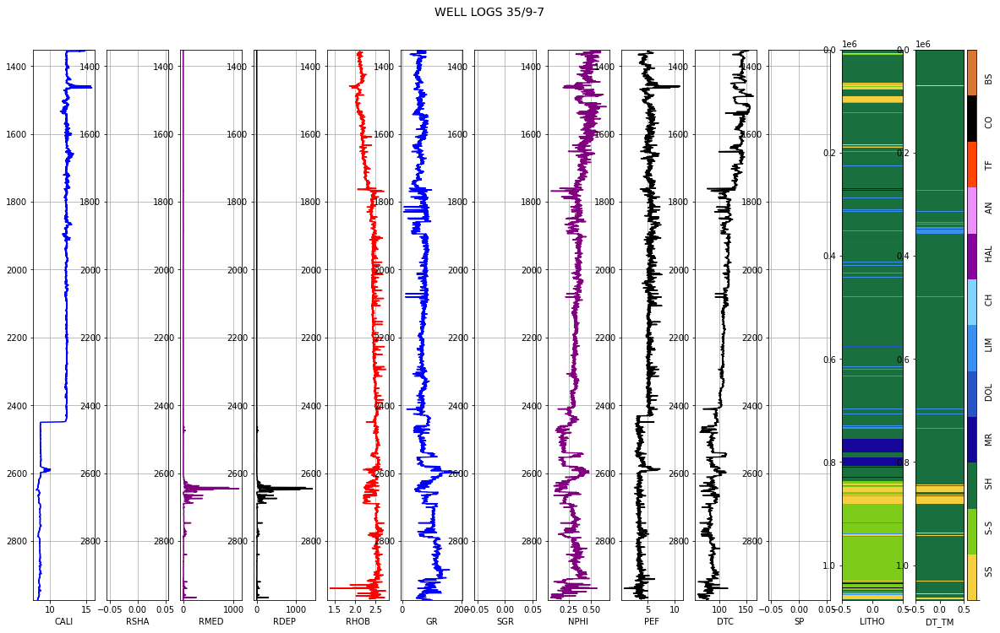

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_dt_res, i, 1)

#### A5. RANDOM FOREST

In [ ]:
"""Predicting lithofacies by using the Random Forest model
(RF) by calling run_RF function.

See RF_model.py for further details about the function.
"""

from module_lithopred.ML_models.RF_model import run_RF
train_pred_rf, open_pred_rf, hidden_pred_rf = run_RF(train_norm, test_norm, hidden_norm)

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""
 
print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_rf))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_rf))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.4959077836875087
Hidden set report:               precision    recall  f1-score   support

           0       0.73      0.79      0.76     14045
           1       0.58      0.27      0.37     12283
           2       0.85      0.96      0.90     71827
           3       0.42      0.24      0.31      4396
           4       0.10      0.01      0.01       287
           5       0.59      0.63      0.61      8374
           6       0.59      0.38      0.46      2905
           7       0.99      0.98      0.99      6498
           8       0.73      0.68      0.70       597
           9       0.64      0.26      0.37       941
          10       0.87      0.64      0.74       244

    accuracy                           0.80    122397
   macro avg       0.64      0.53      0.56    122397
weighted avg       0.77      0.80      0.78    122397



In [ ]:
"""Storing RF predctions into a copy of the formated datasets.
"""
train_rf_res = training_form.copy()
test_rf_res = test_form.copy()
hidden_rf_res = hidden_form.copy()

#Appending predictions to a copy of the augmented datasets
train_rf_res['RF_TM'] = train_pred_rf
test_rf_res['RF_TM'] = open_pred_rf
hidden_rf_res['RF_TM'] = hidden_pred_rf

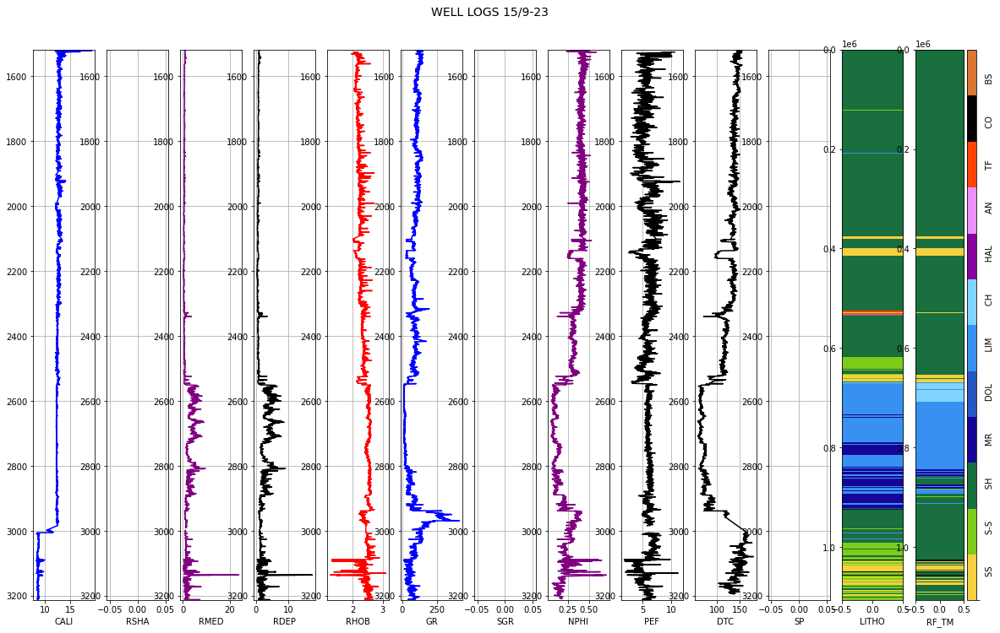

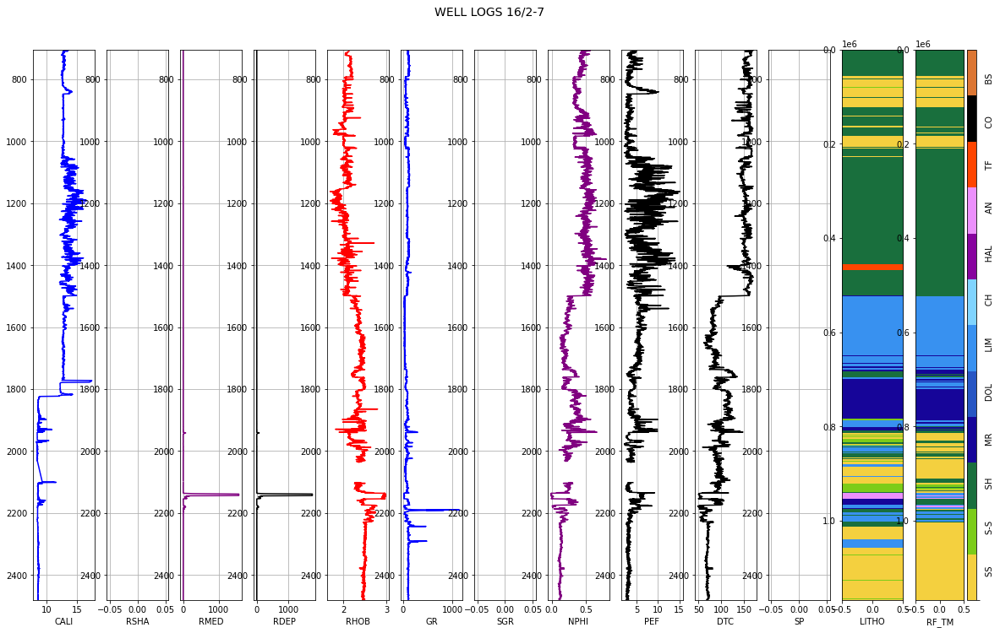

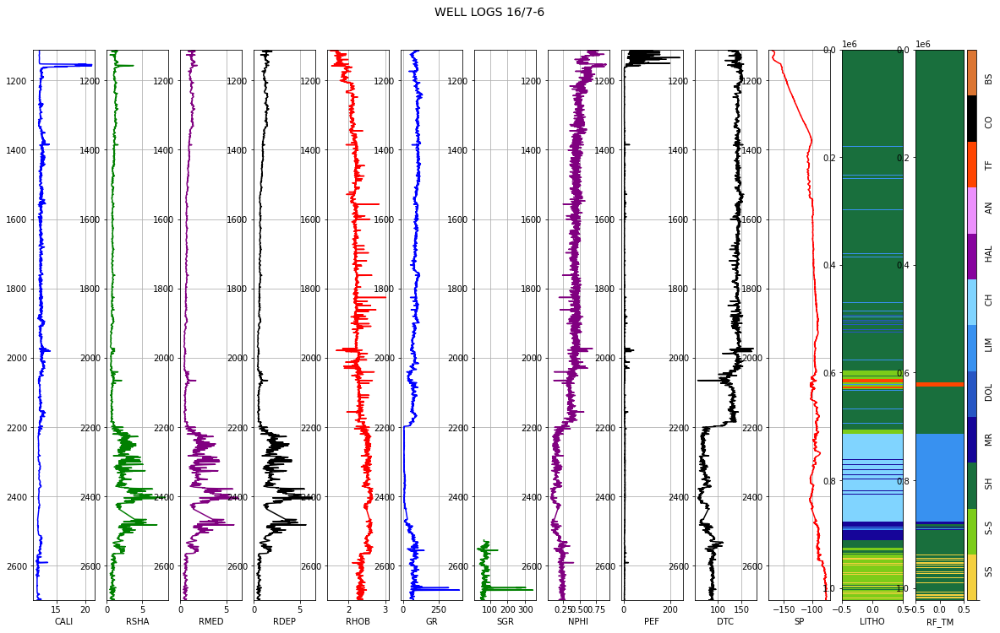

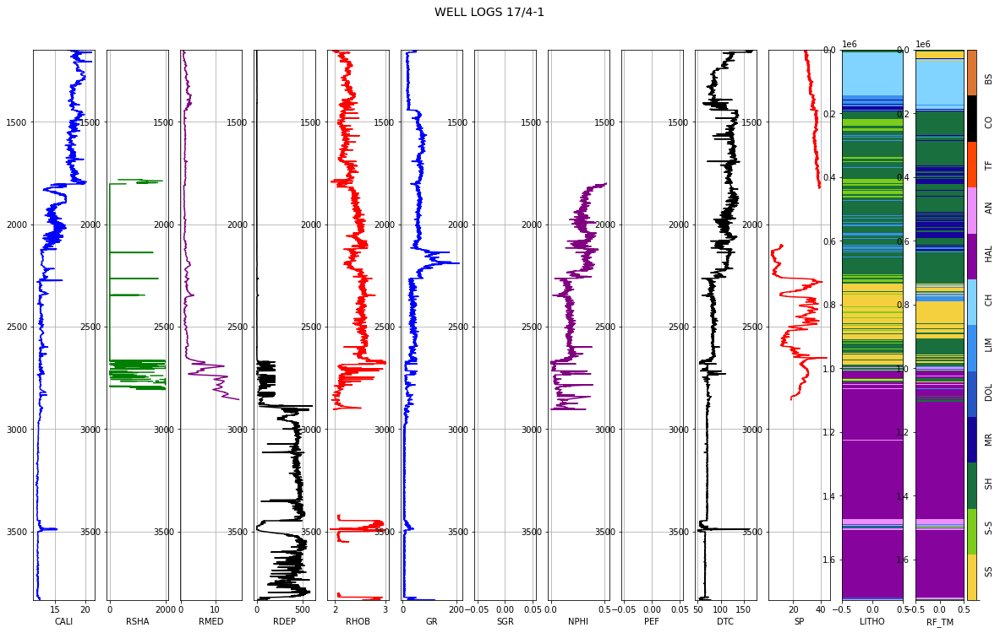

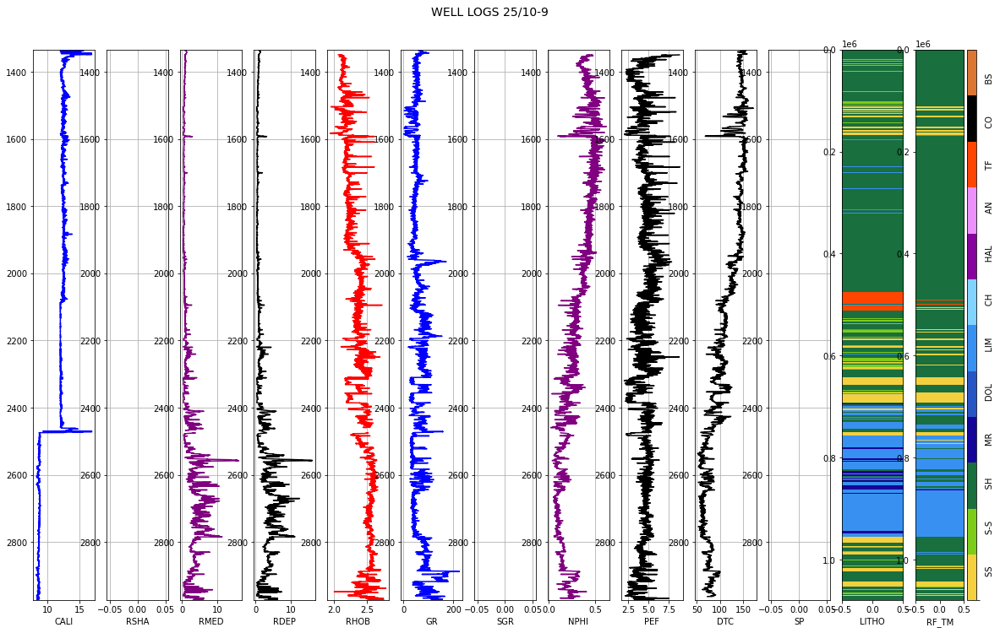

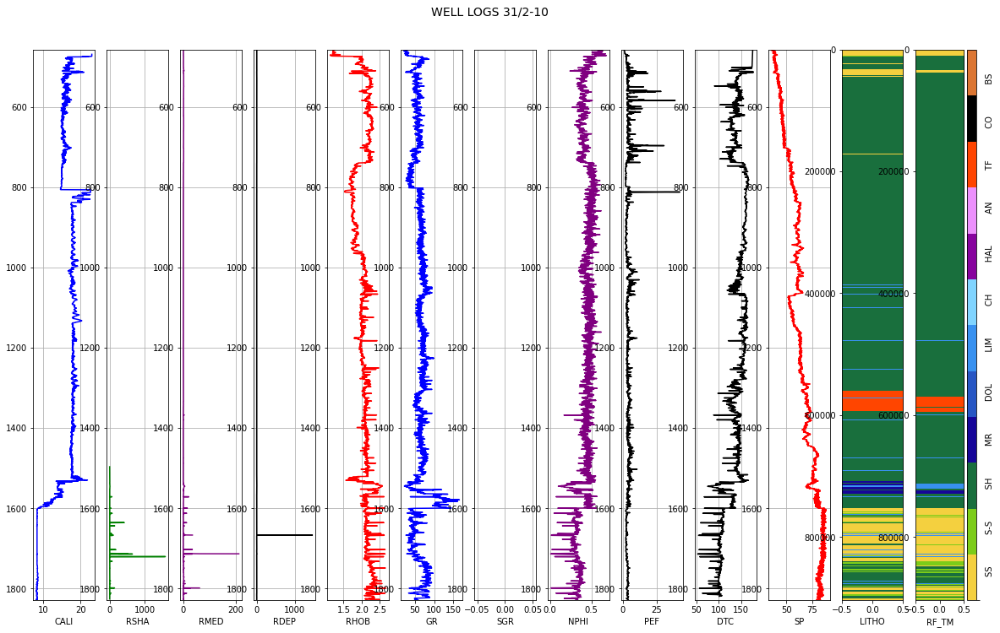

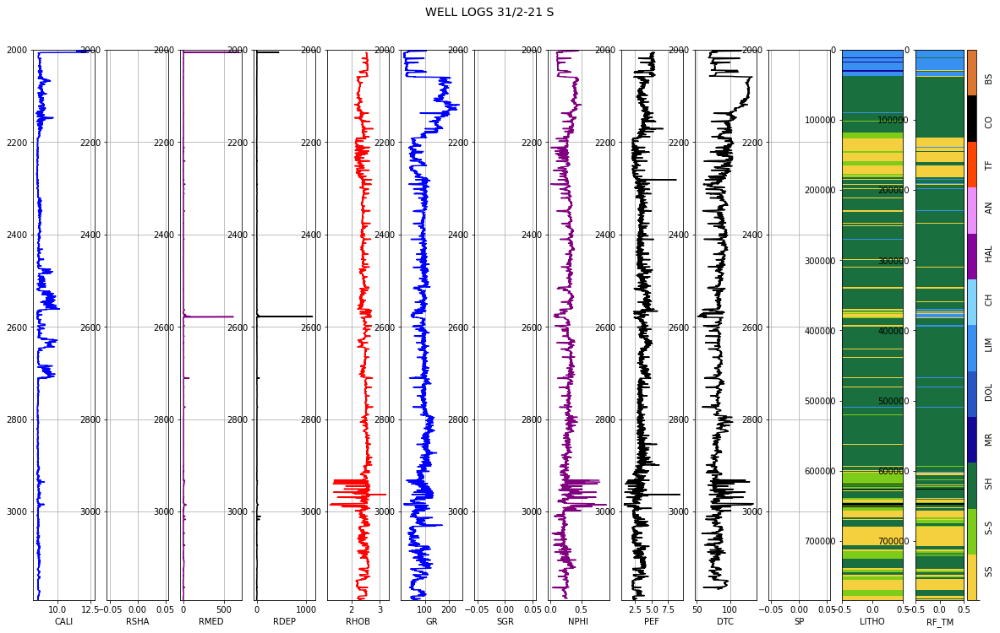

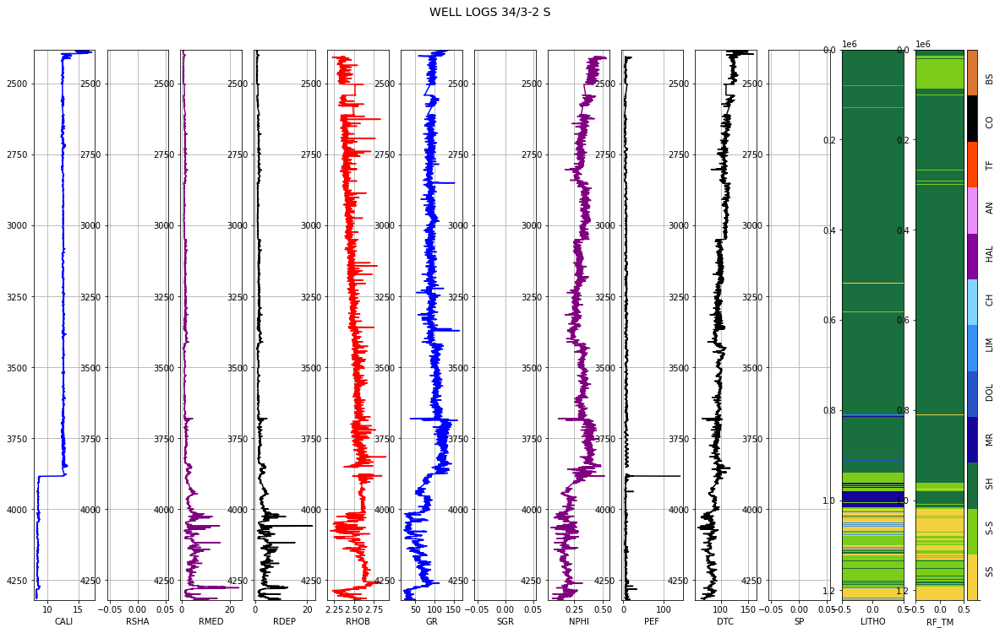

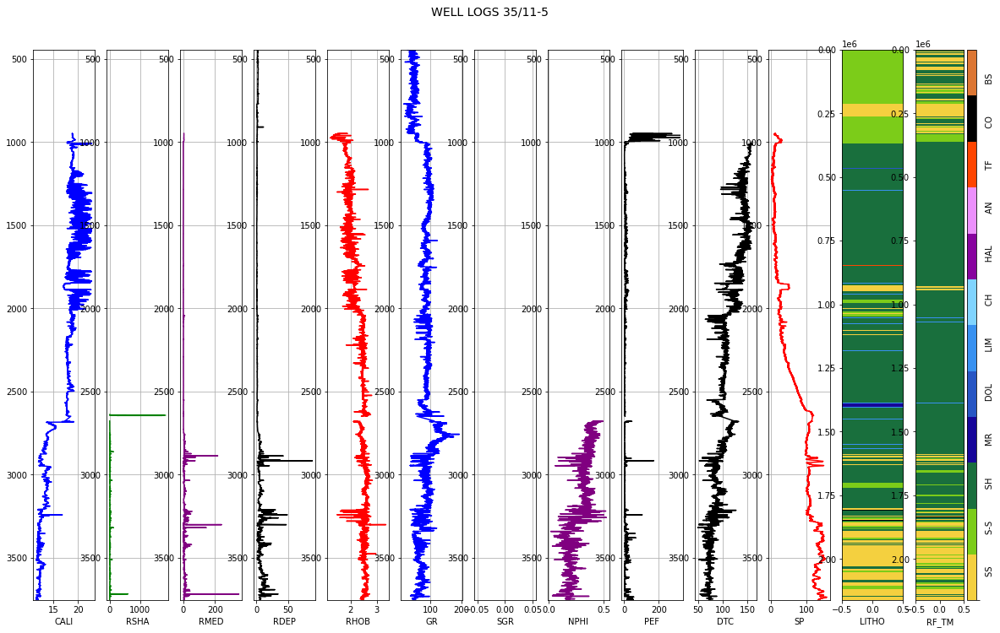

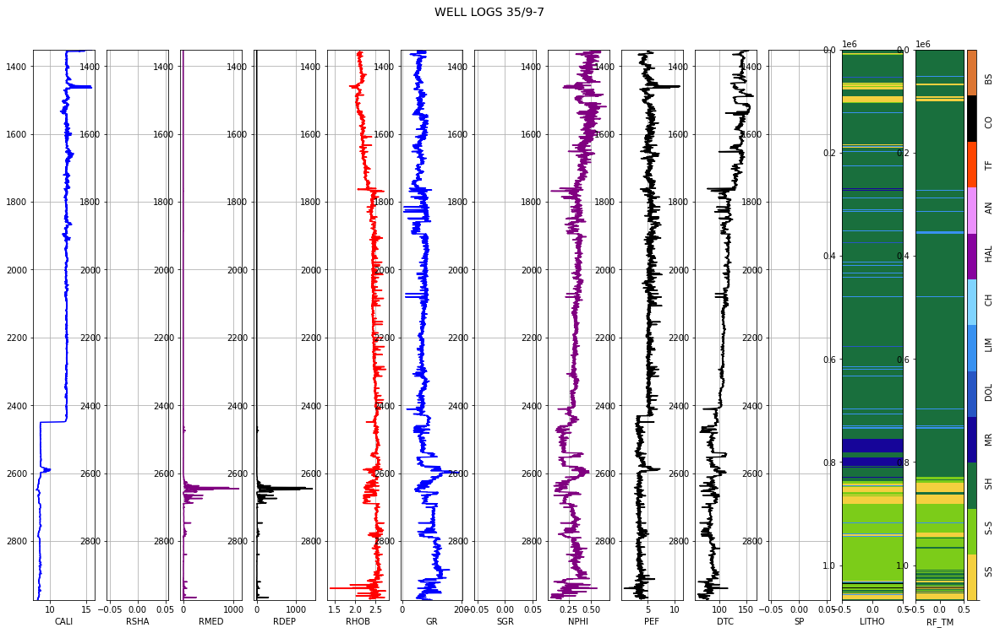

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_rf_res, i, 1)

#### A6. CATEGORICAL GRADIENT BOOSTING MODEL (CATBOOST)

In [ ]:
"""Predicting lithofacies by using the Categorical Gradient Boosting model
(CATBOST) by calling run_CatBoost function.

See CatBoost_model.py for further details about the function.
"""
from module_lithopred.ML_models.CatBoost_model import run_CatBoost

train_pred_cat, test_pred_cat, hidden_pred_cat = run_CatBoost(train_norm, test_norm, hidden_norm)

0:	learn: 1.9772993	test: 1.9783677	best: 1.9783677 (0)	total: 54.4ms	remaining: 54.3s
100:	learn: 0.5208376	test: 0.5219040	best: 0.5219040 (100)	total: 3.55s	remaining: 31.6s
200:	learn: 0.4485447	test: 0.4502547	best: 0.4502547 (200)	total: 6.94s	remaining: 27.6s
300:	learn: 0.4095891	test: 0.4120603	best: 0.4120603 (300)	total: 10.4s	remaining: 24.1s
400:	learn: 0.3864372	test: 0.3894232	best: 0.3894232 (400)	total: 13.8s	remaining: 20.6s
500:	learn: 0.3698771	test: 0.3732154	best: 0.3732154 (500)	total: 17.2s	remaining: 17.1s
600:	learn: 0.3558800	test: 0.3594062	best: 0.3594062 (600)	total: 20.6s	remaining: 13.7s
700:	learn: 0.3450562	test: 0.3490368	best: 0.3490368 (700)	total: 24s	remaining: 10.2s
800:	learn: 0.3354833	test: 0.3396963	best: 0.3396963 (800)	total: 27.4s	remaining: 6.81s
900:	learn: 0.3278865	test: 0.3323900	best: 0.3323900 (900)	total: 30.8s	remaining: 3.39s
999:	learn: 0.3214649	test: 0.3261112	best: 0.3261112 (999)	total: 34.2s	remaining: 0us
bestTest = 0.3261

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_cat))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_cat))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.43934593985146697
Hidden set report:               precision    recall  f1-score   support

           0       0.76      0.84      0.80     14045
           1       0.68      0.44      0.54     12283
           2       0.88      0.94      0.91     71827
           3       0.28      0.30      0.29      4396
           4       0.00      0.00      0.00       287
           5       0.65      0.60      0.62      8374
           6       0.67      0.46      0.55      2905
           7       0.99      1.00      0.99      6498
           8       0.78      0.81      0.79       597
           9       0.60      0.56      0.58       941
          10       0.79      0.67      0.72       244

    accuracy                           0.82    122397
   macro avg       0.64      0.60      0.62    122397
weighted avg       0.81      0.82      0.81    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing CATBOOST predctions into a copy of the formated datasets.
"""
train_cat_res = training_form.copy()
test_cat_res = test_form.copy()
hidden_cat_res = hidden_form.copy()

#Appending predictions to a copy of the augmented datasets
train_cat_res['CAT_TM'] = train_pred_cat
test_cat_res['CAT_TM'] = test_pred_cat
hidden_cat_res['CAT_TM'] = hidden_pred_cat

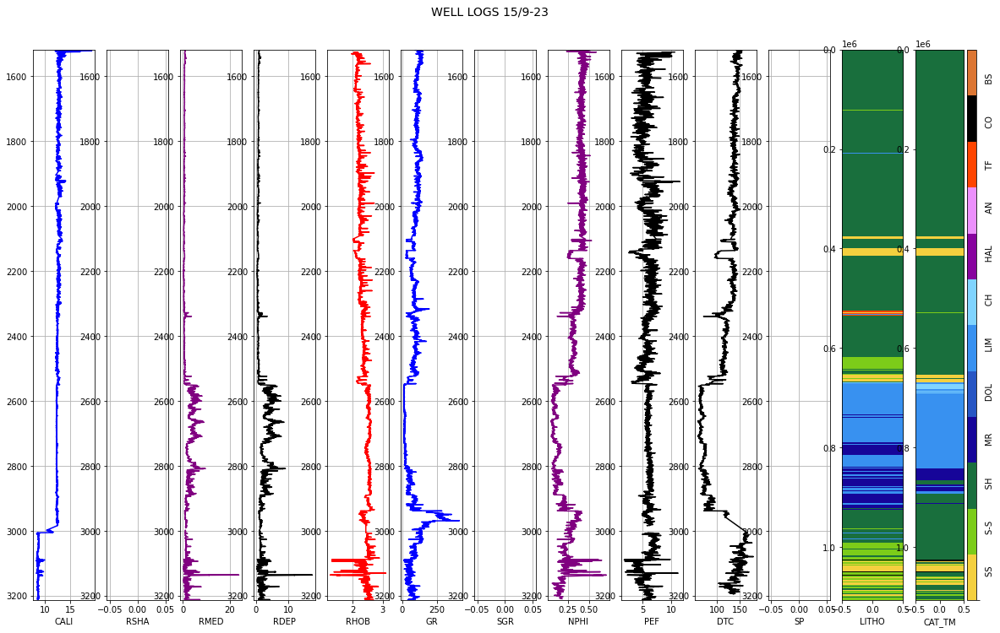

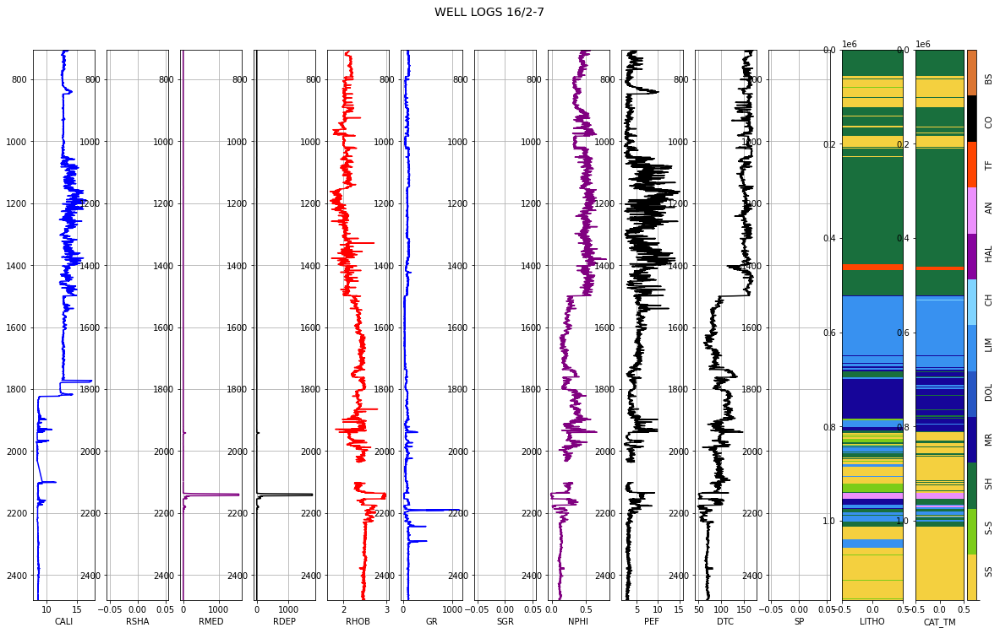

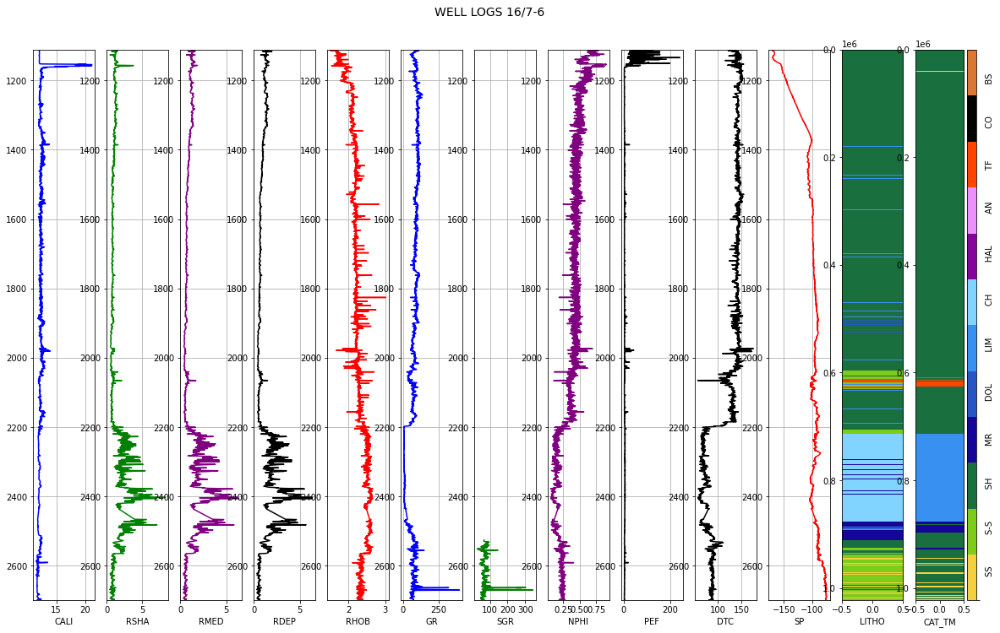

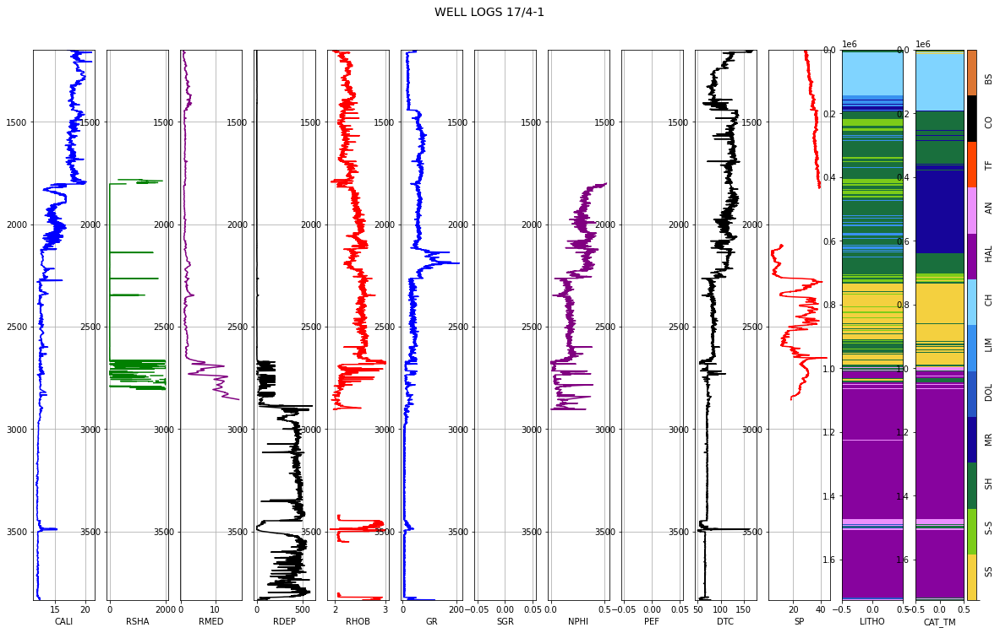

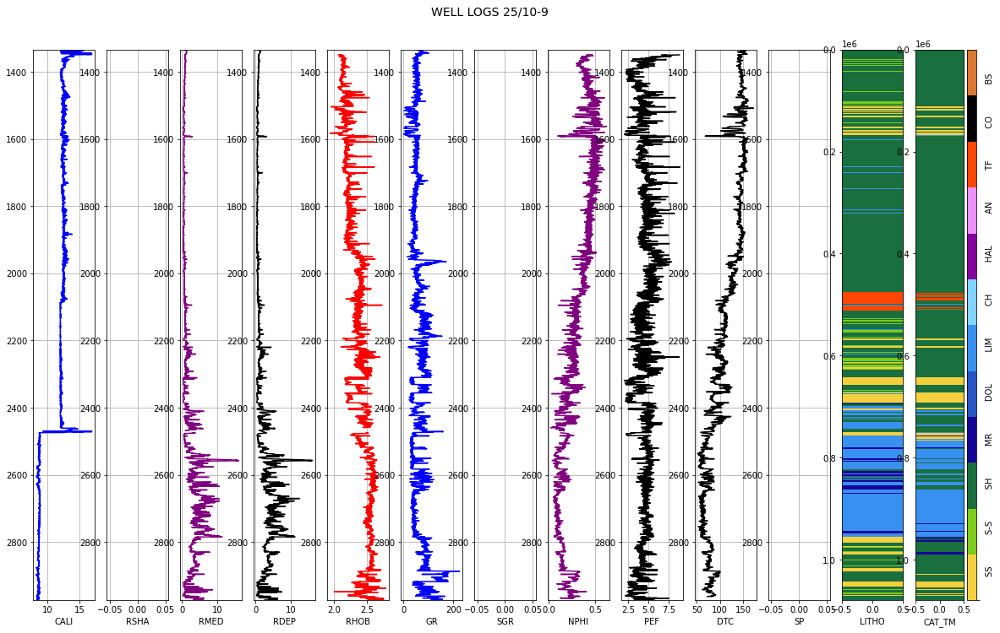

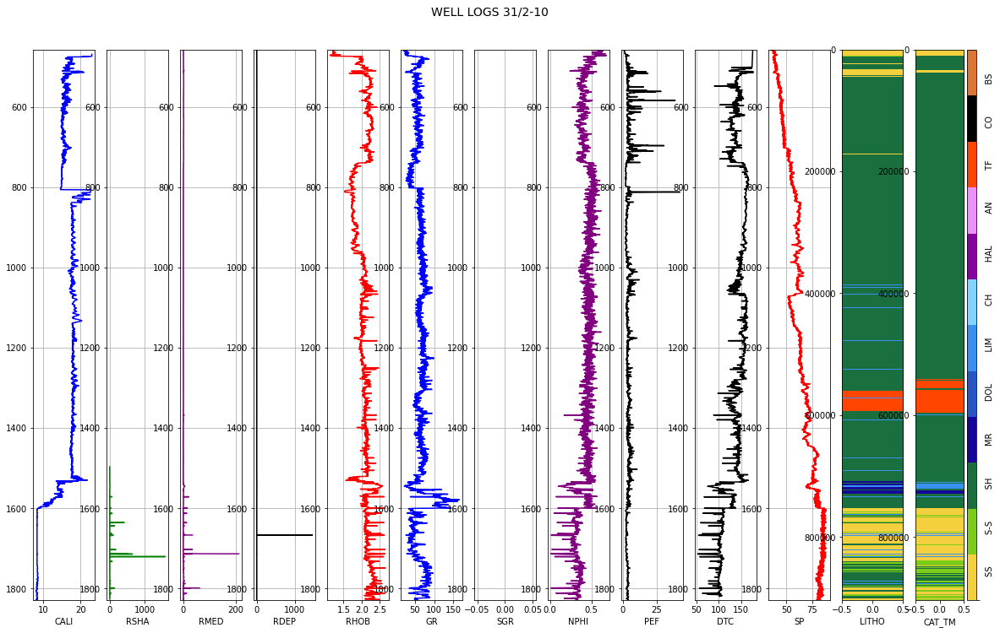

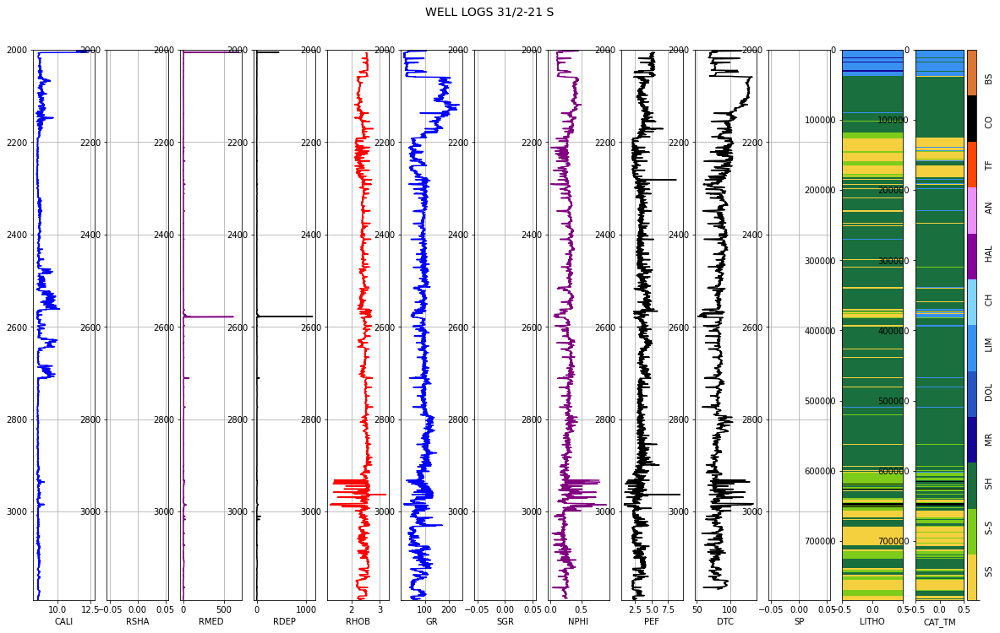

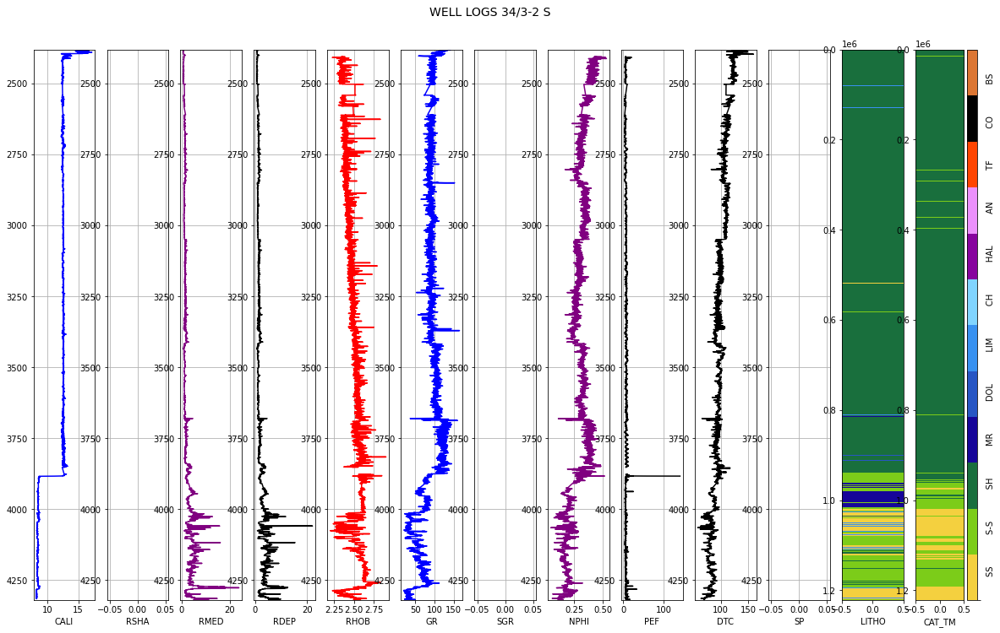

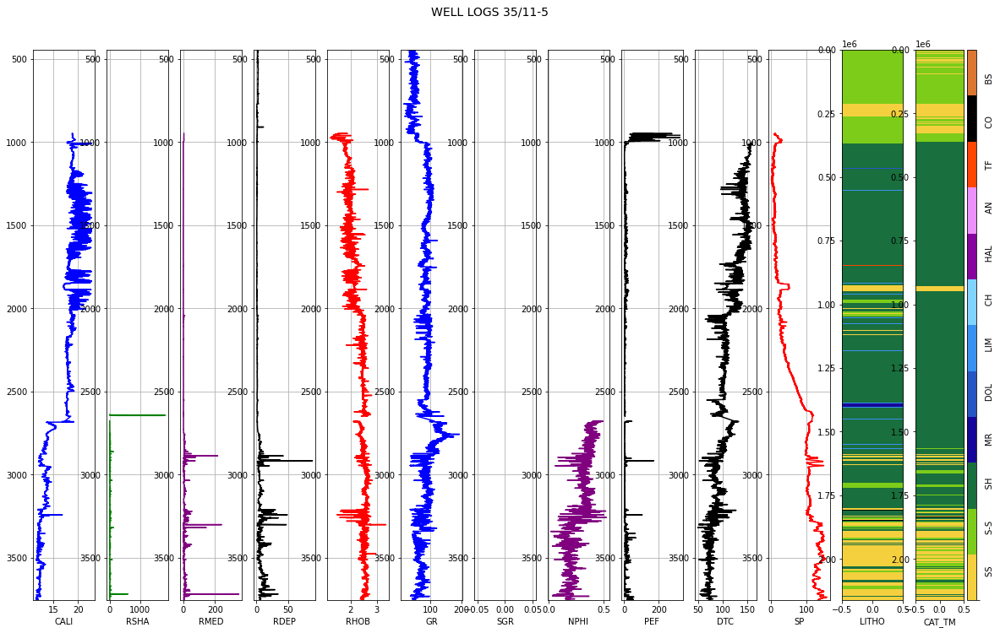

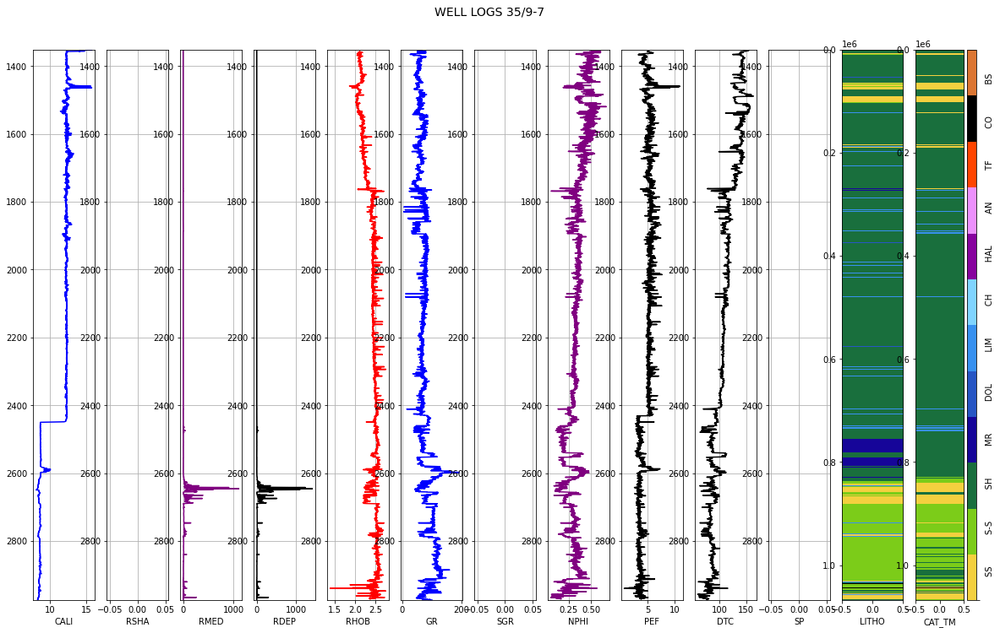

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_cat_res, i, 1)

#### A7. LIGTH GRADIENT BOOSTING MODEL (LIGTHBOOST)

In [ ]:
"""Predicting lithofacies by using the Light Gradient Boosting model
(LGBM) by calling run_CatBoost function.

See LightBoost_model.py for further details about the function.
"""
from module_lithopred.ML_models.LightBoost_model import run_LightBoost
train_pred_light, test_pred_light, hidden_pred_light = run_LightBoost(train_norm, test_norm, hidden_norm)

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[525]	valid_0's multi_logloss: 0.67912


In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_light))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_light))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.47952462070148777
Hidden set report:               precision    recall  f1-score   support

           0       0.73      0.83      0.78     14045
           1       0.67      0.40      0.50     12283
           2       0.88      0.95      0.91     71827
           3       0.22      0.22      0.22      4396
           4       0.00      0.00      0.00       287
           5       0.54      0.51      0.52      8374
           6       0.57      0.32      0.41      2905
           7       0.99      1.00      0.99      6498
           8       0.75      0.08      0.14       597
           9       0.64      0.30      0.41       941
          10       0.82      0.54      0.65       244

    accuracy                           0.80    122397
   macro avg       0.62      0.47      0.50    122397
weighted avg       0.79      0.80      0.79    122397



In [ ]:
"""Storing LGBM predctions into a copy of the formated datasets.
"""
train_light_res = training_form.copy()
test_light_res = test_form.copy()
hidden_light_res = hidden_form.copy()

train_light_res['LIGHT_TM'] = train_pred_light
test_light_res['LIGHT_TM'] = test_pred_light
hidden_light_res['LIGHT_TM'] = hidden_pred_light

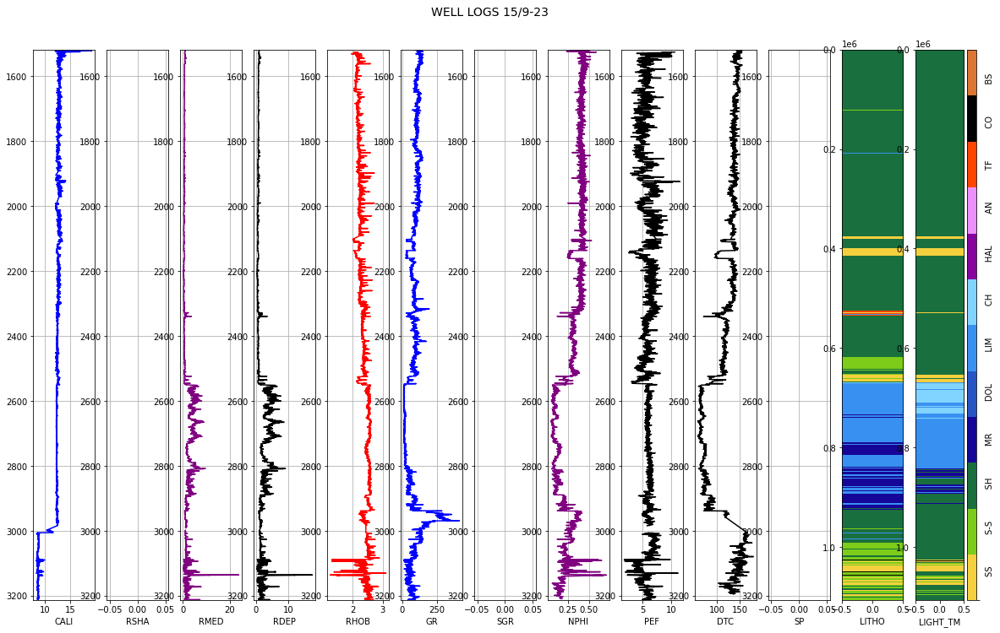

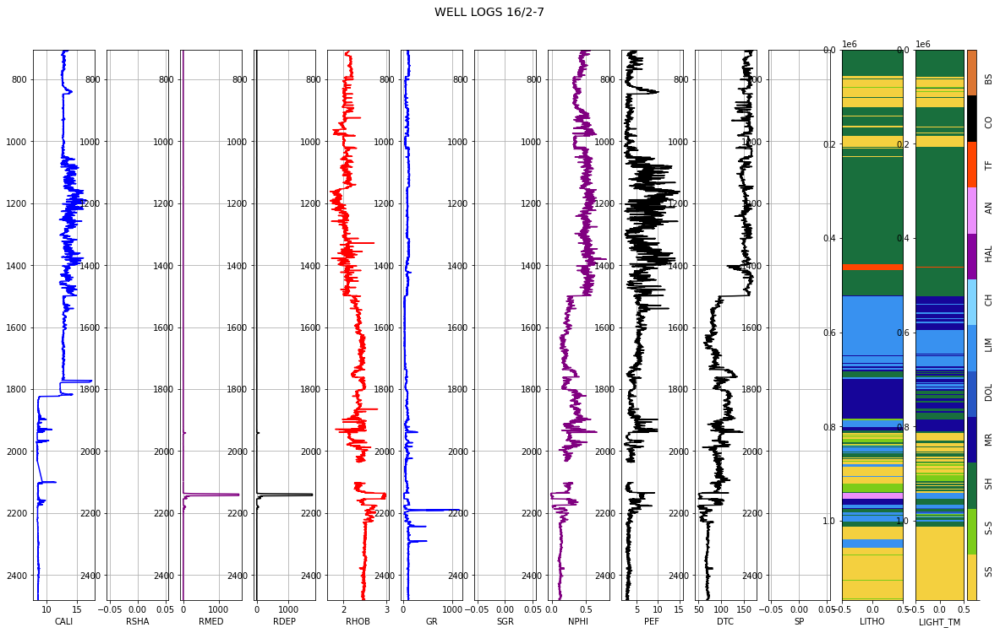

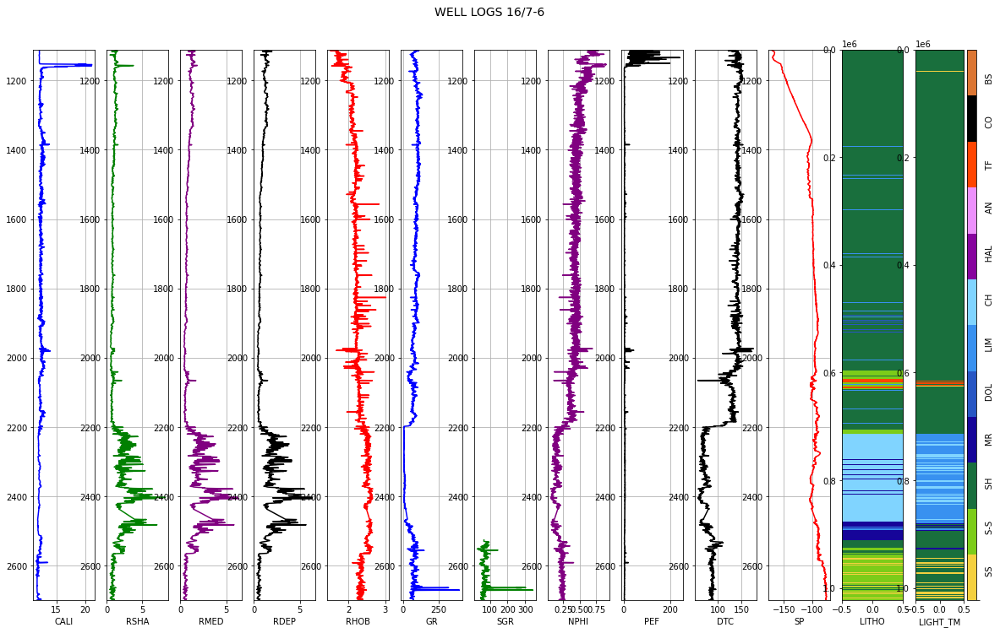

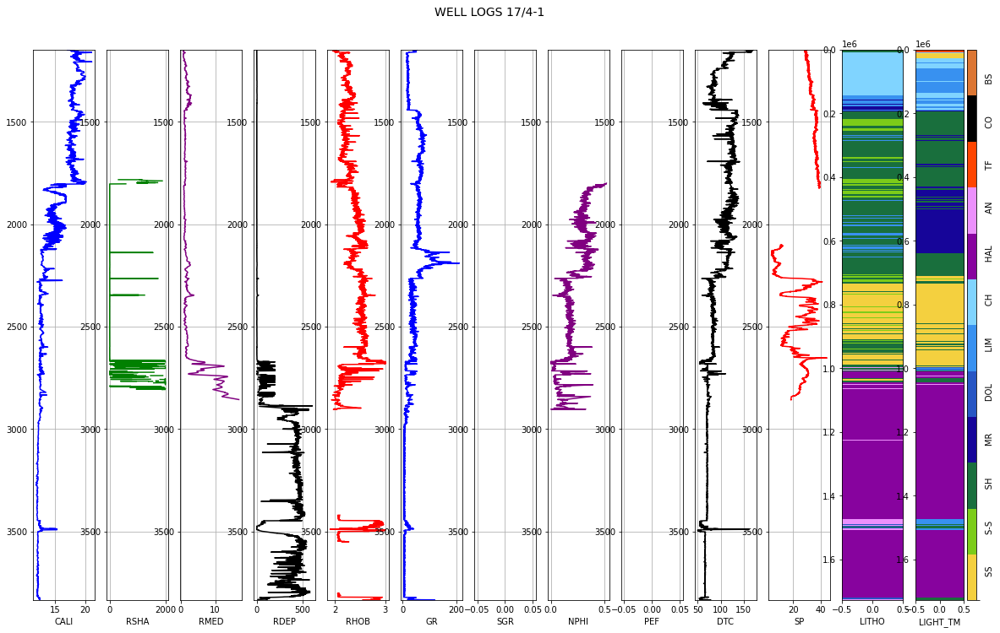

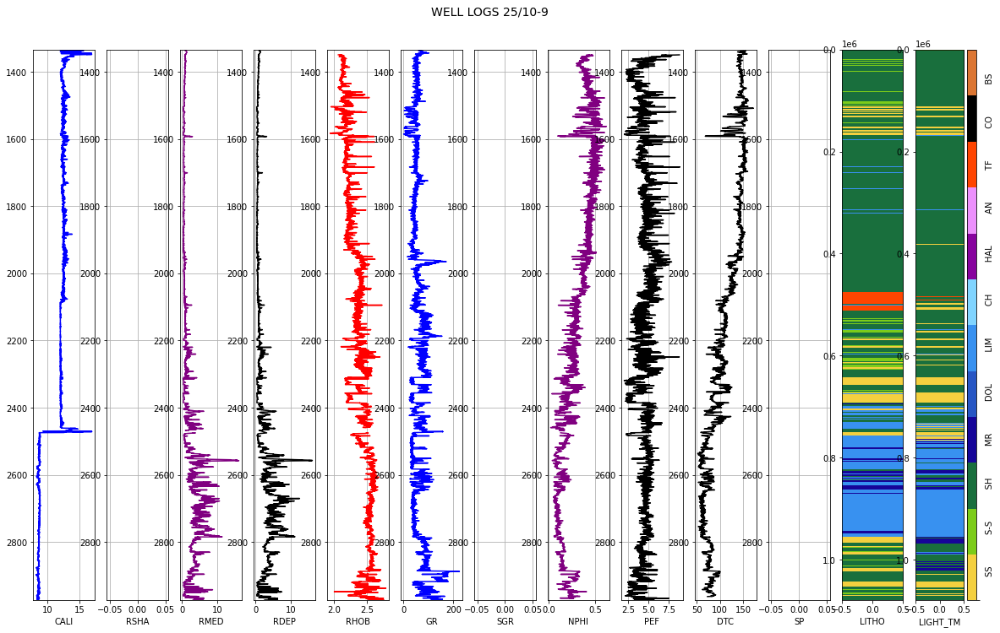

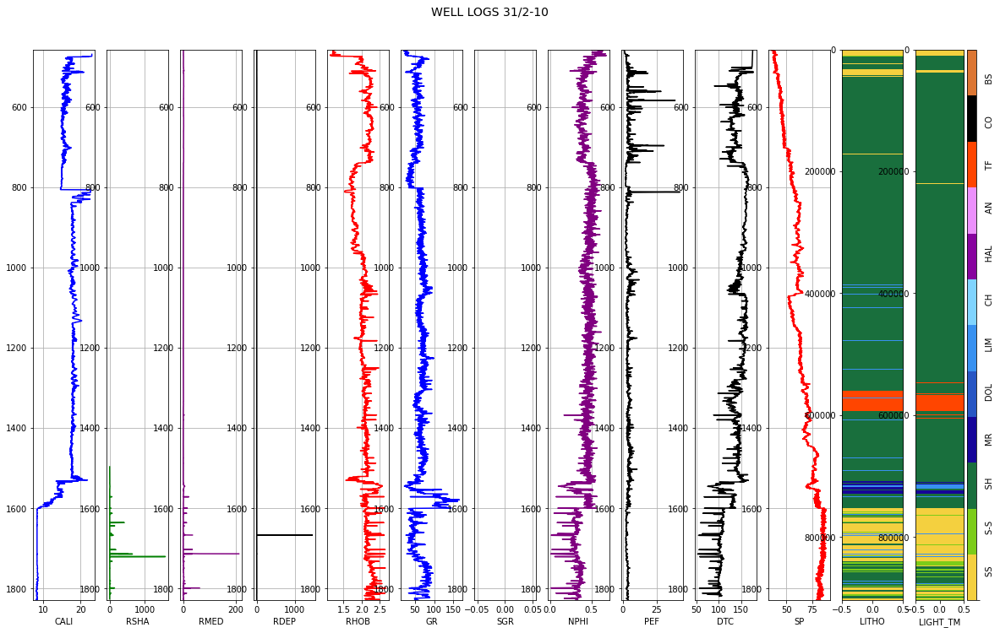

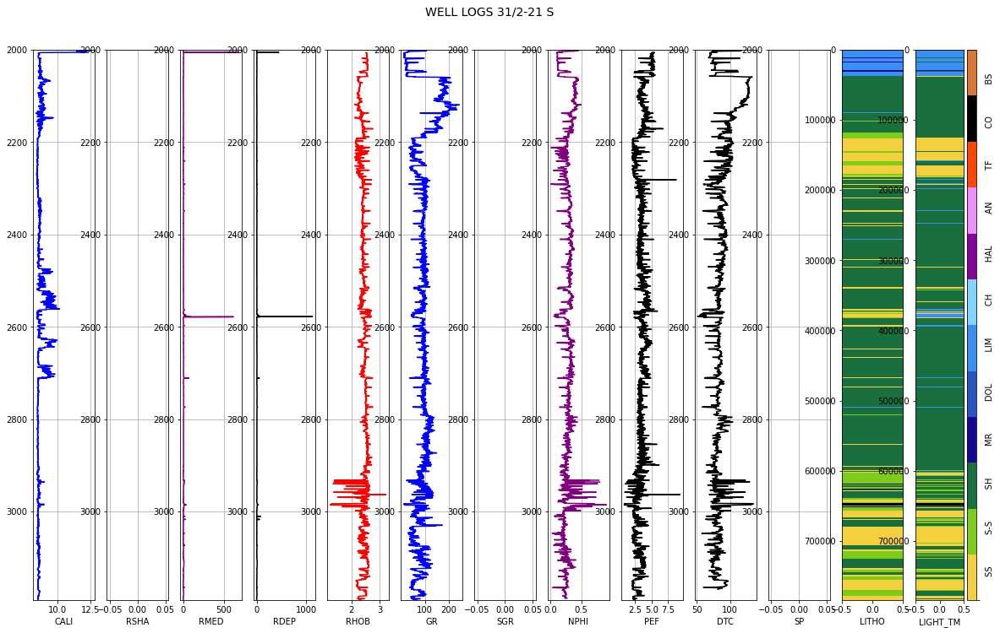

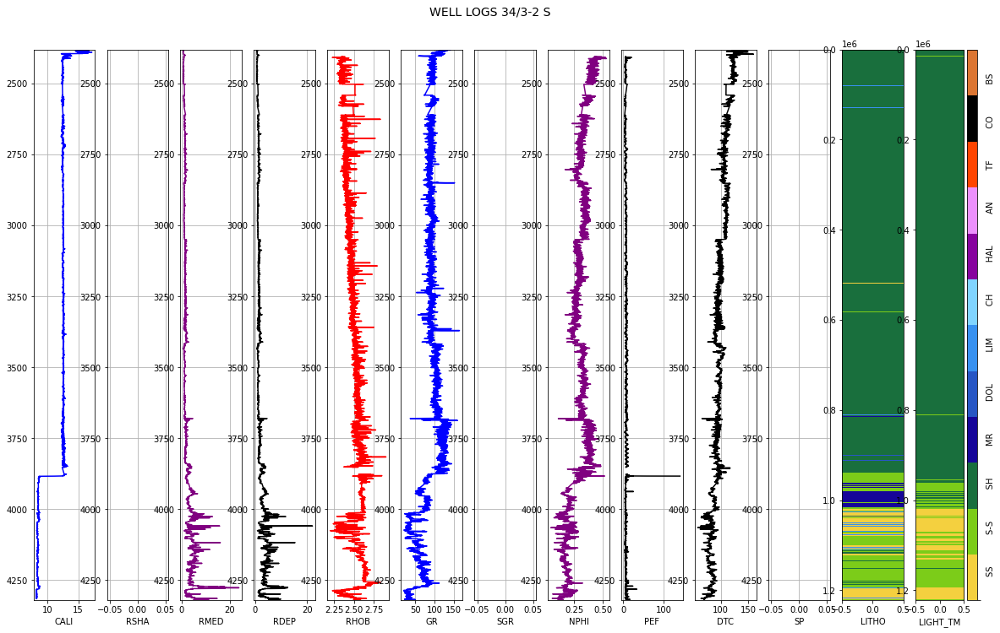

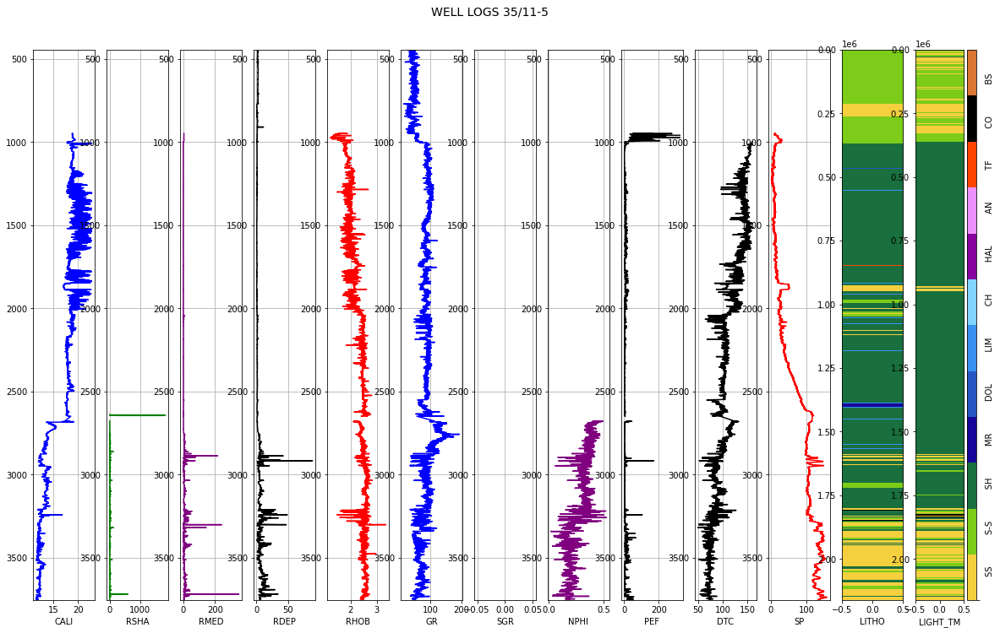

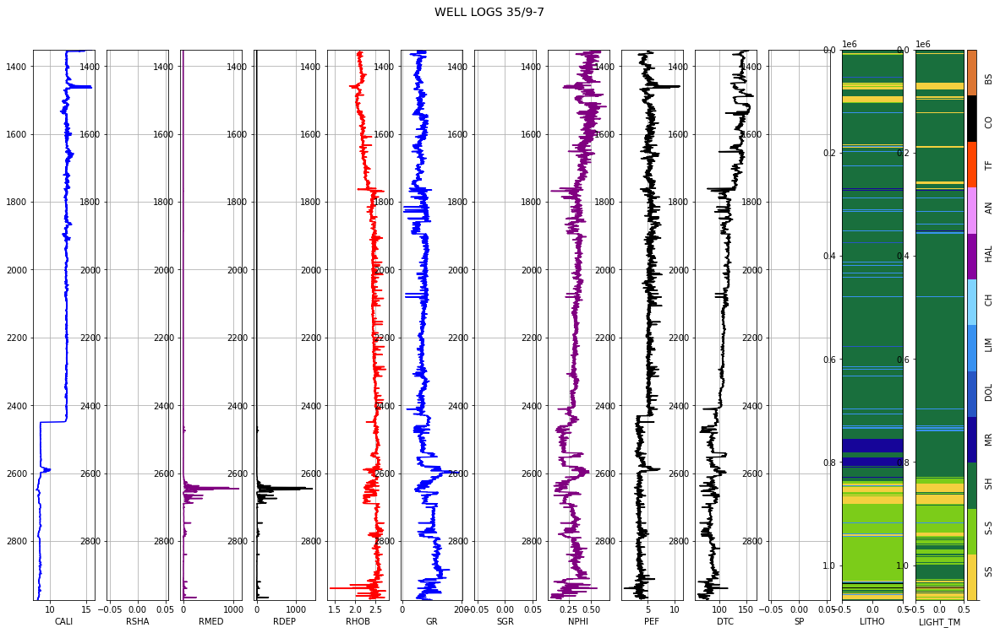

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_light_res, i, 1)

#### A8. EXTREME GRADIENT BOOSTING MODEL (XGB)

In [ ]:
"""Predicting lithofacies by using the eXtreme Gradient Boosting model (XGB)
by calling run_XGB function.

See XGB_model.py for further details about the function.
"""
from module_lithopred.ML_models.XGB_model import run_XGB

train_pred_xgb, test_pred_xgb, hidden_pred_xgb = run_XGB(train_norm, test_norm, hidden_norm)

[0]	validation_0-merror:0.255724
Will train until validation_0-merror hasn't improved in 100 rounds.
[100]	validation_0-merror:0.166336
[200]	validation_0-merror:0.144799
[300]	validation_0-merror:0.134222
[400]	validation_0-merror:0.127405
[500]	validation_0-merror:0.123236
[600]	validation_0-merror:0.118896
[700]	validation_0-merror:0.116025
[800]	validation_0-merror:0.113394
[900]	validation_0-merror:0.110618
[999]	validation_0-merror:0.108601
Fold accuracy: 0.8914243242319653
-----------------------FOLD 1---------------------
[0]	validation_0-merror:0.254915
Will train until validation_0-merror hasn't improved in 100 rounds.
[100]	validation_0-merror:0.16621
[200]	validation_0-merror:0.146329
[300]	validation_0-merror:0.136035
[400]	validation_0-merror:0.129012
[500]	validation_0-merror:0.123852
[600]	validation_0-merror:0.120213
[700]	validation_0-merror:0.116522
[800]	validation_0-merror:0.113925
[900]	validation_0-merror:0.111652
[999]	validation_0-merror:0.109841
Fold accuracy:

In [ ]:
""""Plotting the classification report for the hidden test set
and the matrix penalty score.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_xgb))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_xgb))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.4471167593976977
Hidden set report:               precision    recall  f1-score   support

           0       0.76      0.86      0.80     14045
           1       0.66      0.42      0.52     12283
           2       0.88      0.94      0.91     71827
           3       0.27      0.31      0.29      4396
           4       0.12      0.05      0.07       287
           5       0.73      0.51      0.60      8374
           6       0.70      0.73      0.71      2905
           7       0.99      0.99      0.99      6498
           8       0.73      0.65      0.69       597
           9       0.55      0.44      0.49       941
          10       0.79      0.71      0.75       244

    accuracy                           0.82    122397
   macro avg       0.65      0.60      0.62    122397
weighted avg       0.81      0.82      0.81    122397



In [ ]:
"""Storing XGB predctions into a copy of the formated datasets.
"""
train_xgb_res = training_form.copy()
test_xgb_res = test_form.copy()
hidden_xgb_res = hidden_form.copy()

train_xgb_res['XGB_TM'] = train_pred_xgb
test_xgb_res['XGB_TM'] = test_pred_xgb
hidden_xgb_res['XGB_TM'] = hidden_pred_xgb

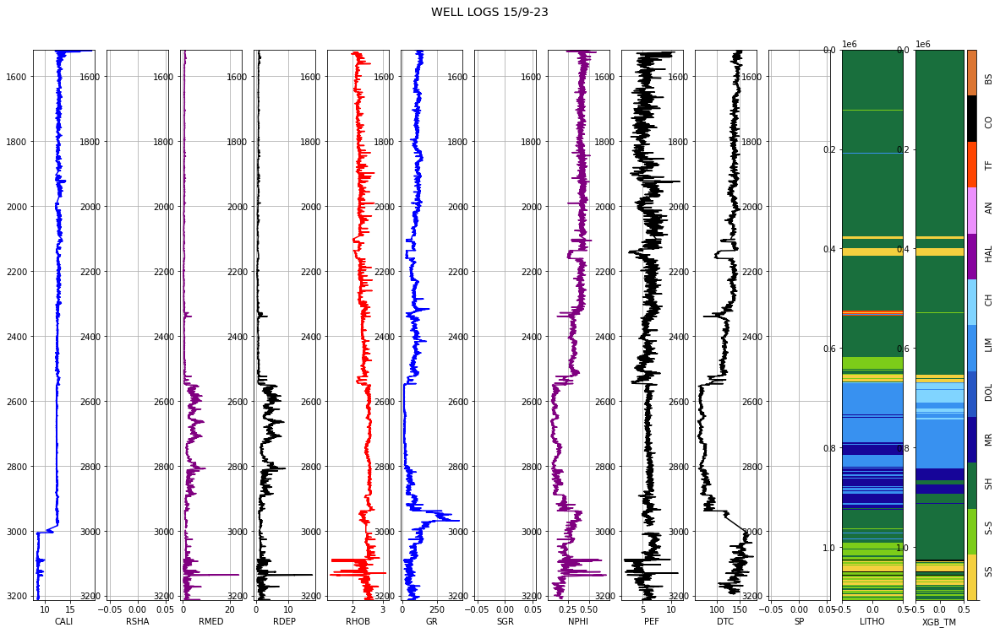

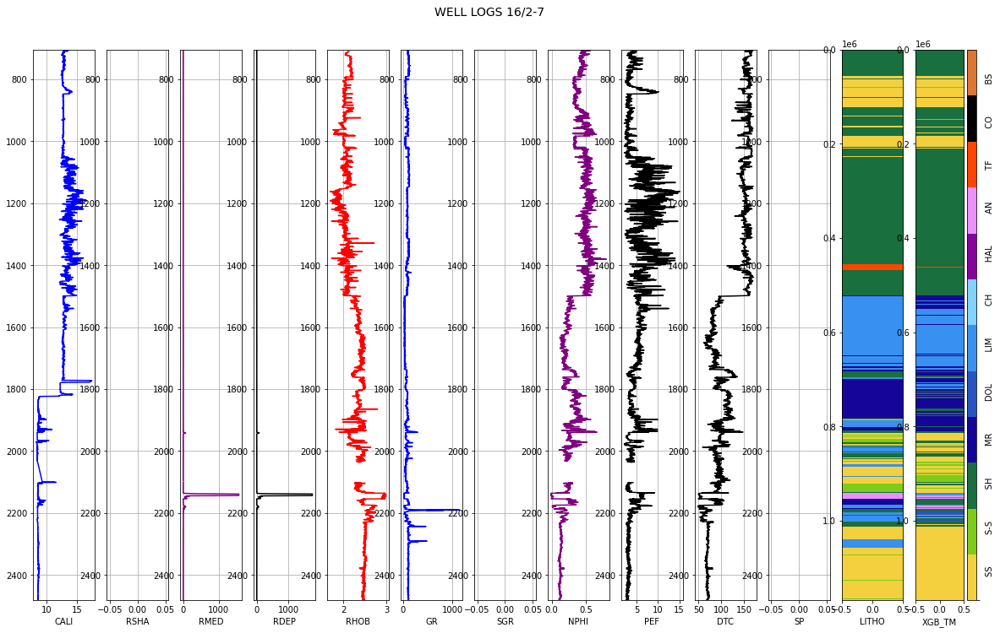

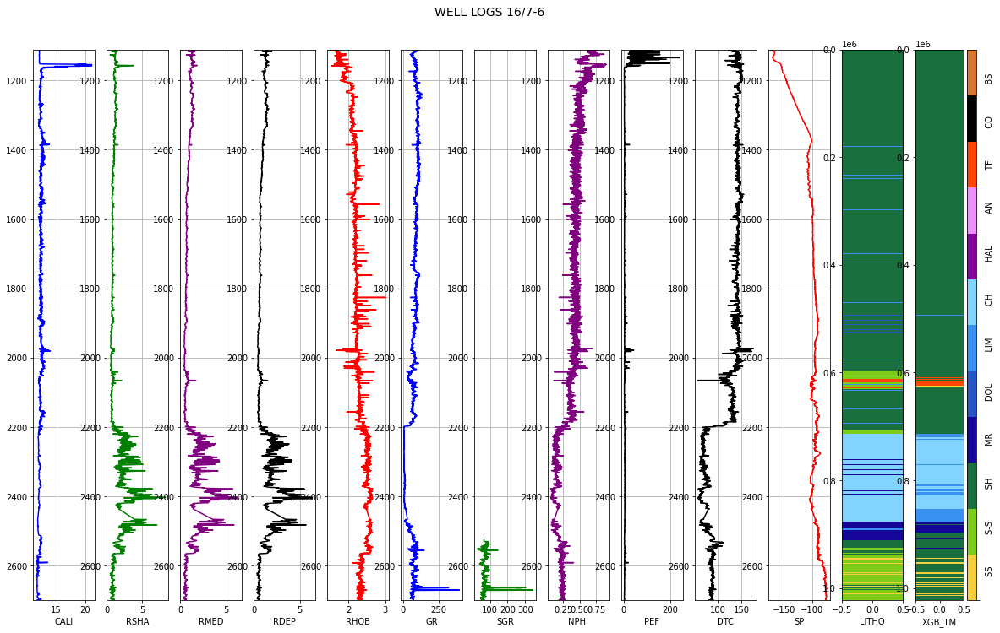

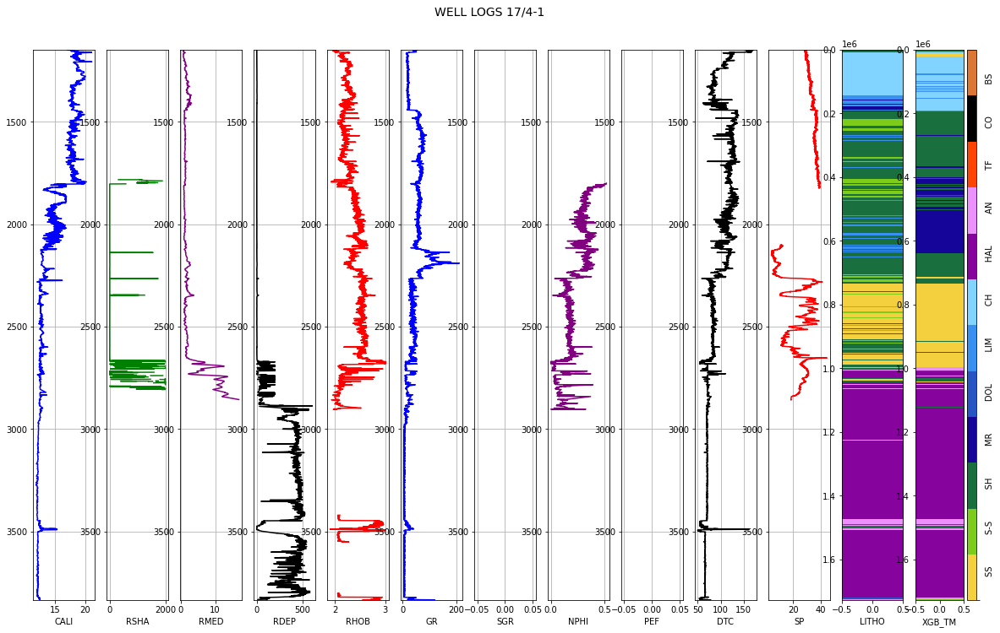

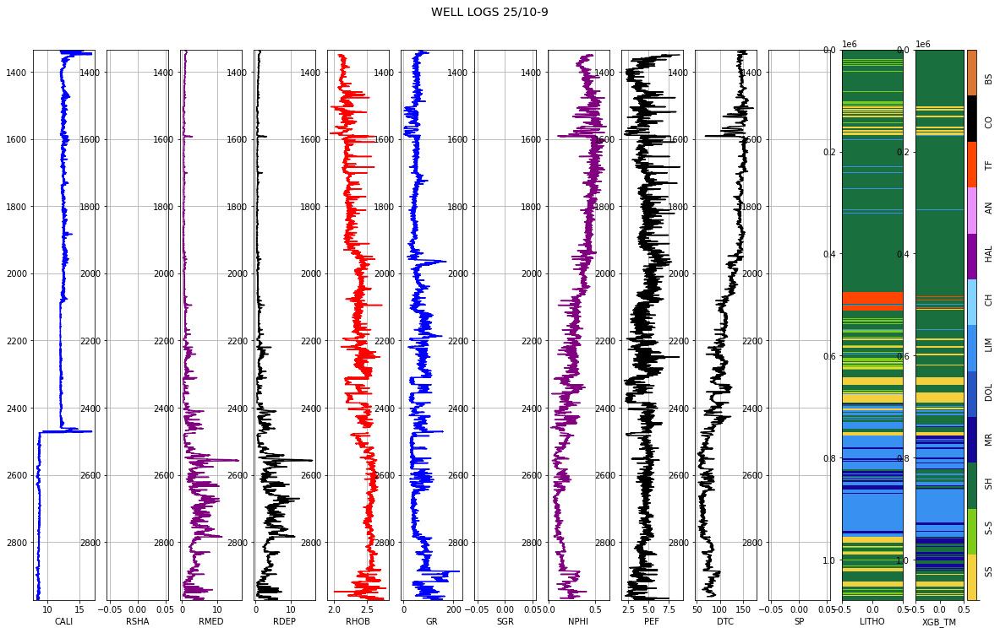

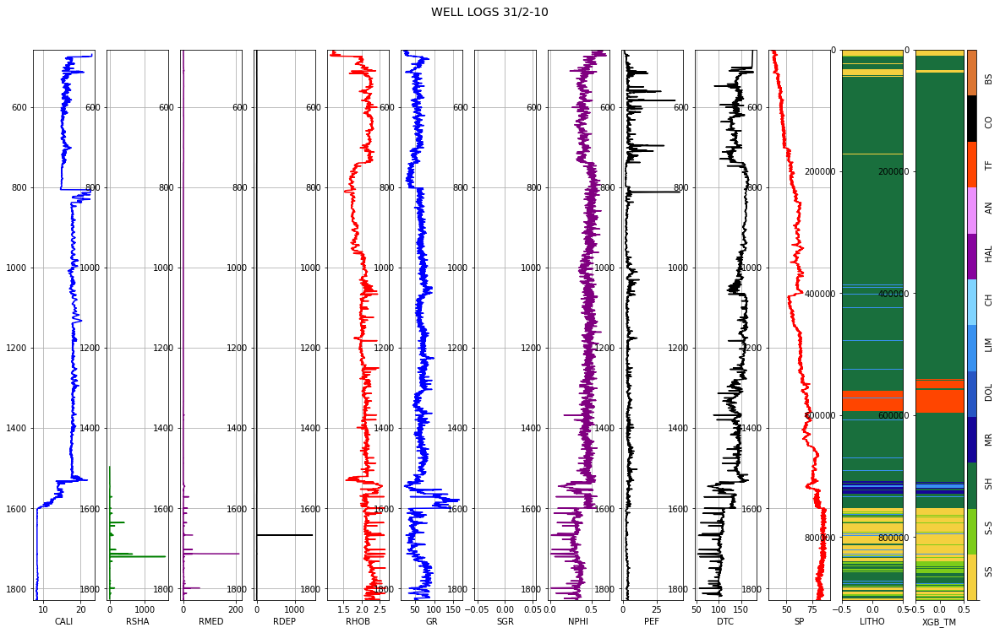

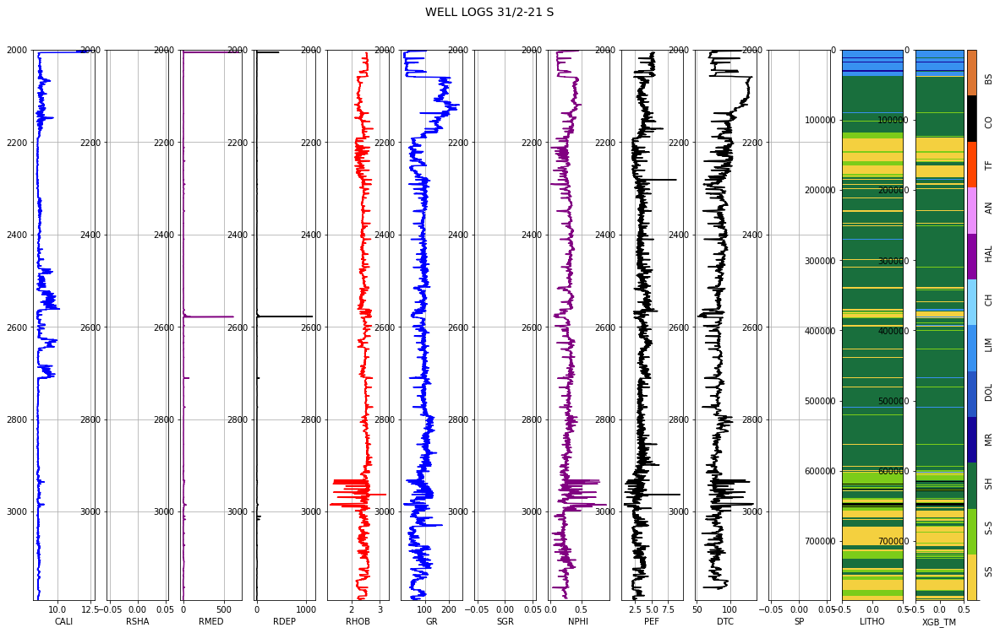

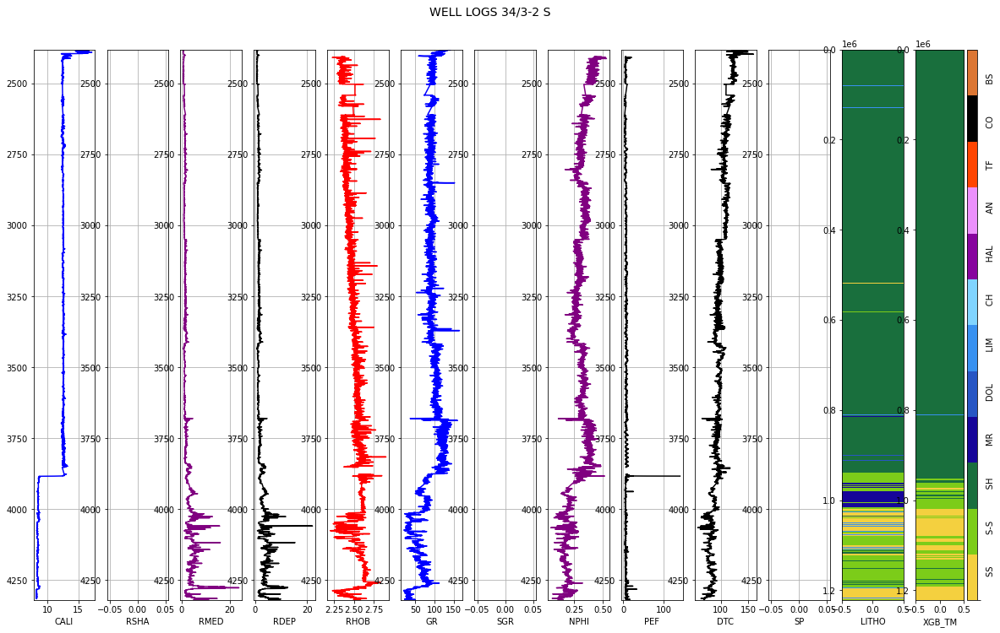

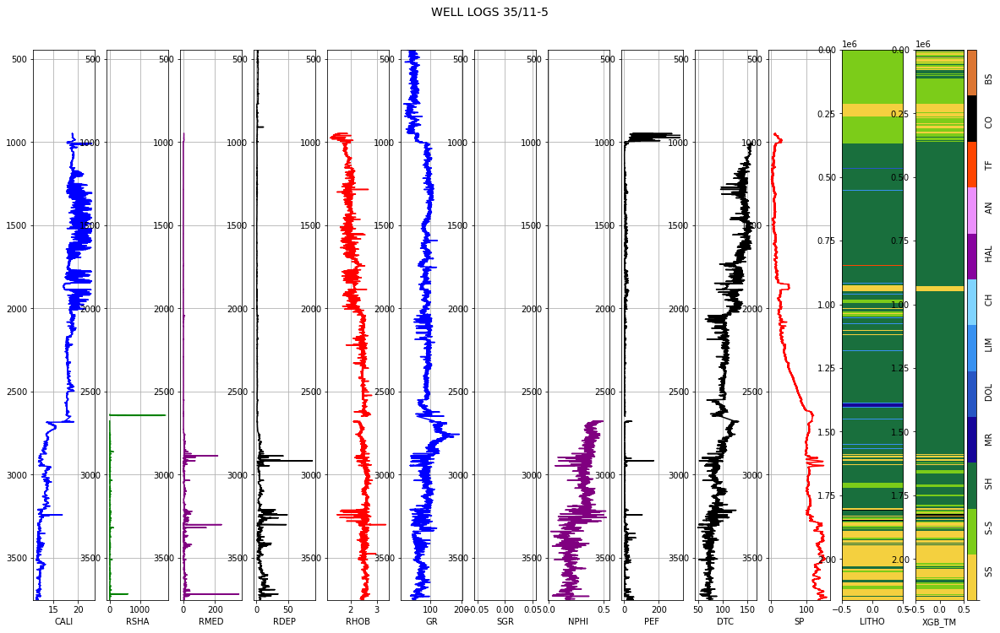

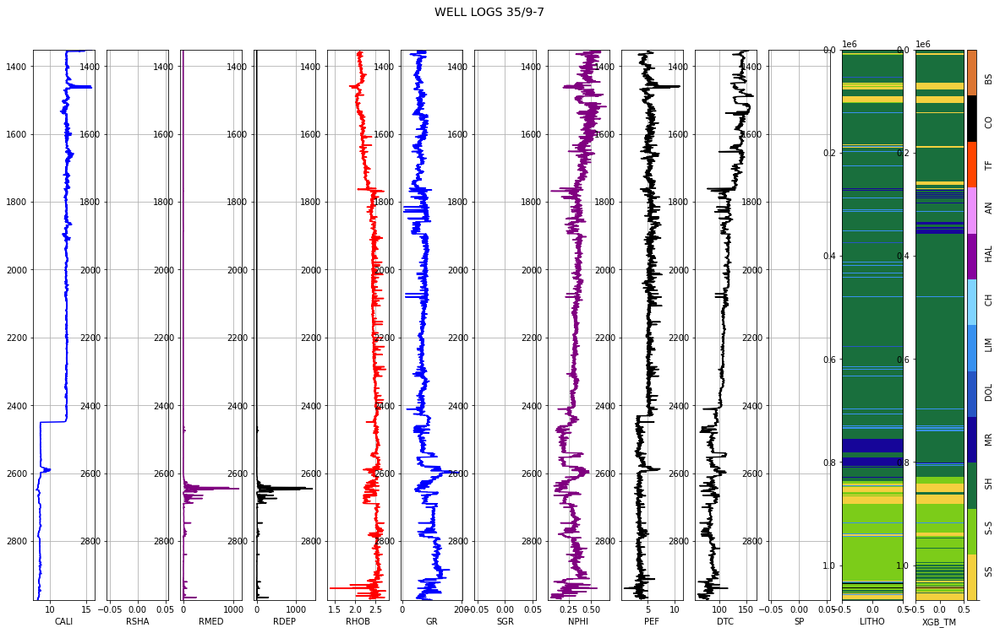

In [ ]:
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 1):
  litho_prediction(hidden_xgb_res, i, 1)

#### A9.NEURAL NETWORK MODEL (NN)

In [ ]:
"""Predicting lithofacies by using the Neural Network
(NN) by calling run_NN function.

See NN_model.py for further details about the function.
"""

from module_lithopred.ML_models.NN_model import run_NN
train_pred_nn, test_pred_nn, hidden_pred_nn = run_NN(train_norm, test_norm, hidden_norm)

Epoch 1/100
4573/4573 [==============================] - 16s 3ms/step - loss: 1.0413 - accuracy: 0.6591 - val_loss: 0.9697 - val_accuracy: 0.6799
Epoch 2/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.9250 - accuracy: 0.6930 - val_loss: 0.9552 - val_accuracy: 0.6862
Epoch 3/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.8897 - accuracy: 0.7024 - val_loss: 0.9503 - val_accuracy: 0.6791
Epoch 4/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.8656 - accuracy: 0.7083 - val_loss: 0.9010 - val_accuracy: 0.7084
Epoch 5/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.8468 - accuracy: 0.7128 - val_loss: 0.8862 - val_accuracy: 0.7126
Epoch 6/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.8319 - accuracy: 0.7163 - val_loss: 0.8691 - val_accuracy: 0.7167
Epoch 7/100
4573/4573 [==============================] - 15s 3ms/step - loss: 0.8174 - accuracy: 0.7200 - val_loss: 0.8447 -

In [ ]:
#Printing Classification Reports
""""Plotting the classification report for the hidden test set
and the matrix penalty score.

See additional_functions.py for further details about  matrix_score
and classification_report functions.
"""

print('-----------------------HIDDEN SET REPORT---------------------')
print('Hidden set penalty matrix score:', matrix_score(hidden_norm.LITHO.values, hidden_pred_nn))
print('Hidden set report:', classification_report(hidden_norm.LITHO, hidden_pred_nn))

-----------------------HIDDEN SET REPORT---------------------
Hidden set penalty matrix score: -0.5646390434406072
Hidden set report:               precision    recall  f1-score   support

           0       0.75      0.75      0.75     14045
           1       0.42      0.24      0.30     12283
           2       0.84      0.92      0.88     71827
           3       0.30      0.24      0.27      4396
           4       0.00      0.00      0.00       287
           5       0.59      0.57      0.58      8374
           6       0.58      0.64      0.61      2905
           7       0.98      0.99      0.99      6498
           8       0.97      0.39      0.55       597
           9       0.42      0.29      0.34       941
          10       0.82      0.55      0.66       244

    accuracy                           0.77    122397
   macro avg       0.61      0.51      0.54    122397
weighted avg       0.75      0.77      0.76    122397



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""Storing NN predctions into a copy of the formated datasets.
"""
train_nn_res = training_form.copy()
test_nn_res = test_form.copy()
hidden_nn_res = hidden_form.copy()

#Appending predictions to a copy of the augmented datasets
train_nn_res['NN_TM'] = train_pred_nn
test_nn_res['NN_TM'] = test_pred_nn
hidden_nn_res['NN_TM'] = hidden_pred_nn

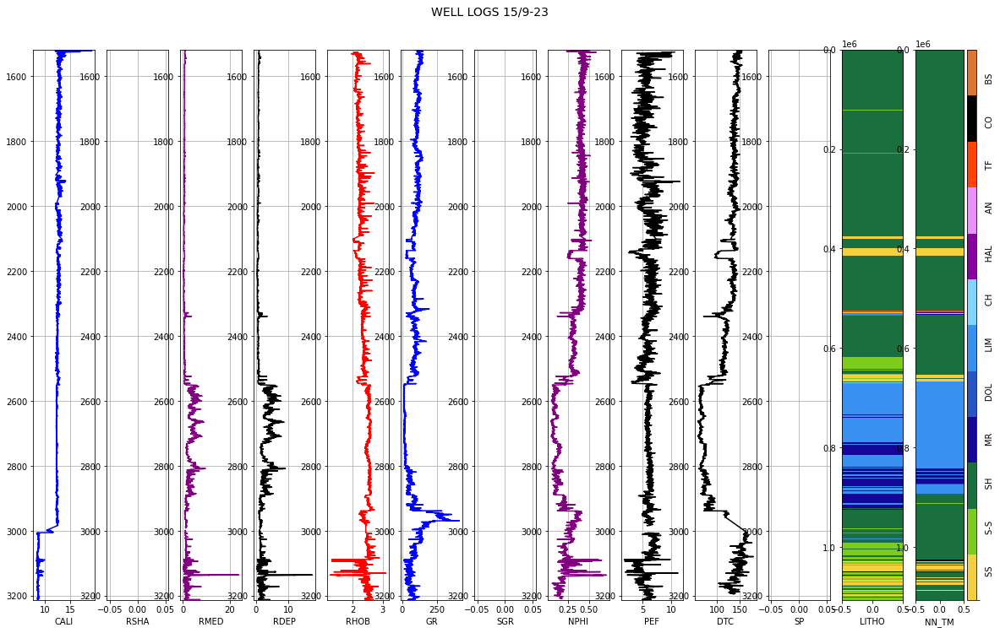

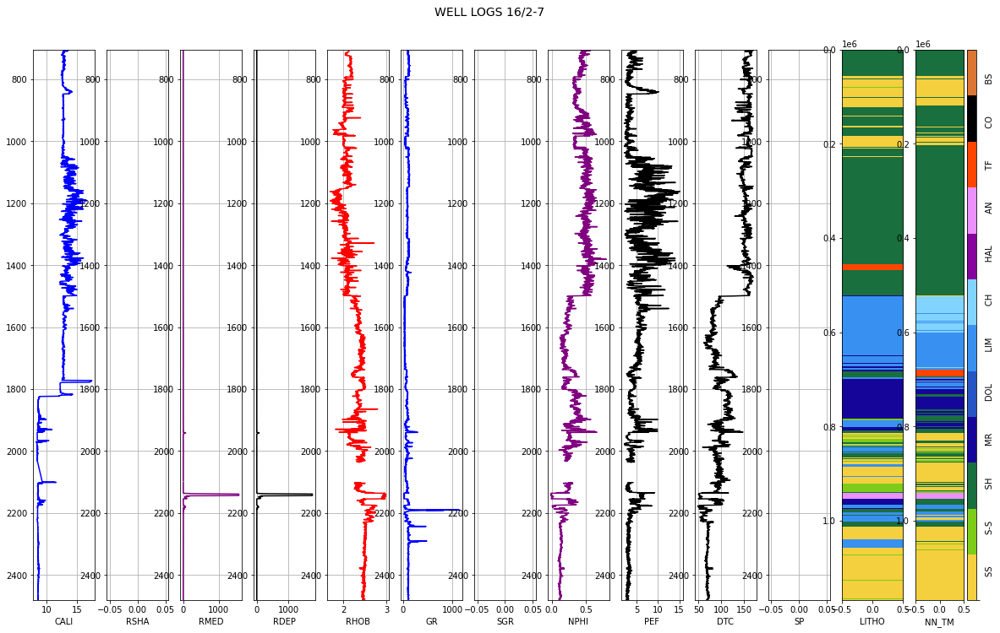

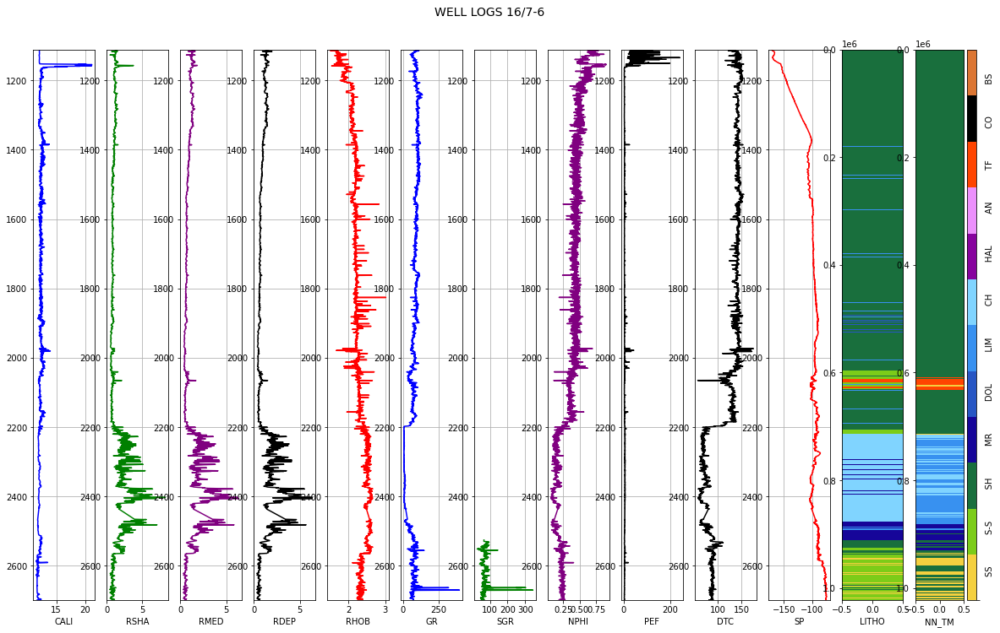

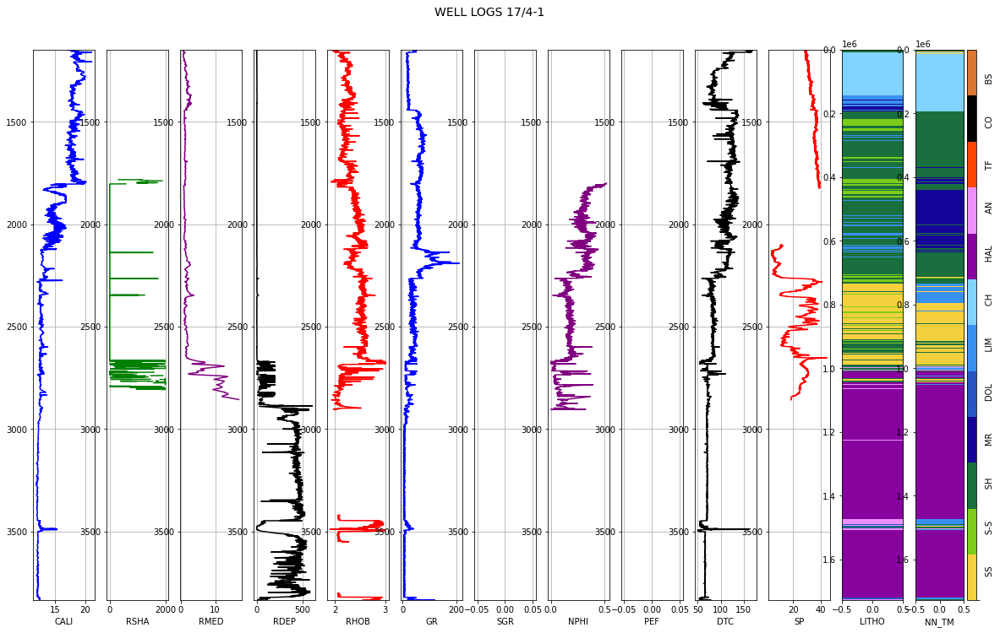

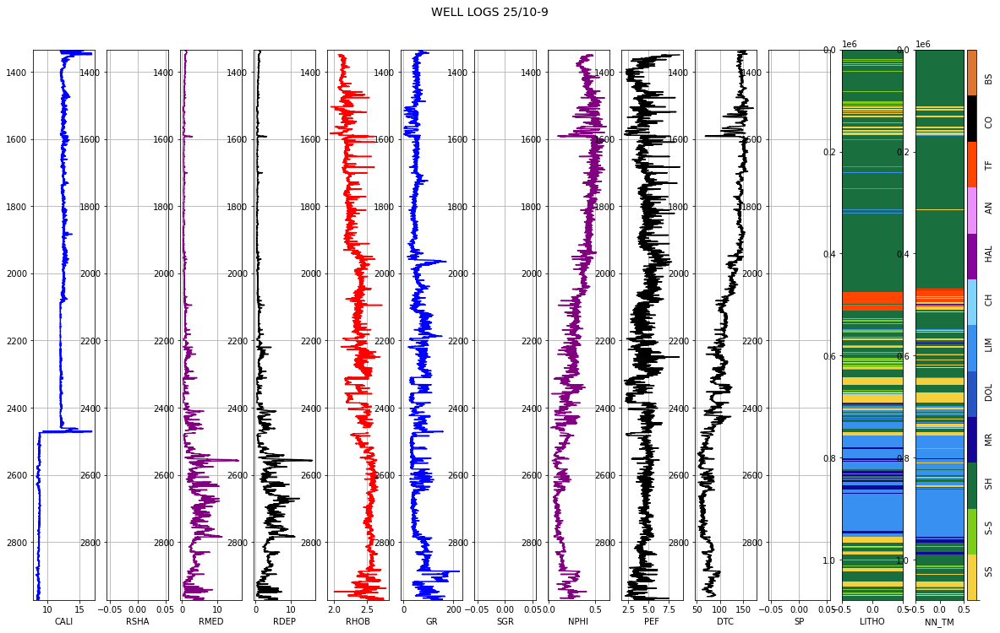

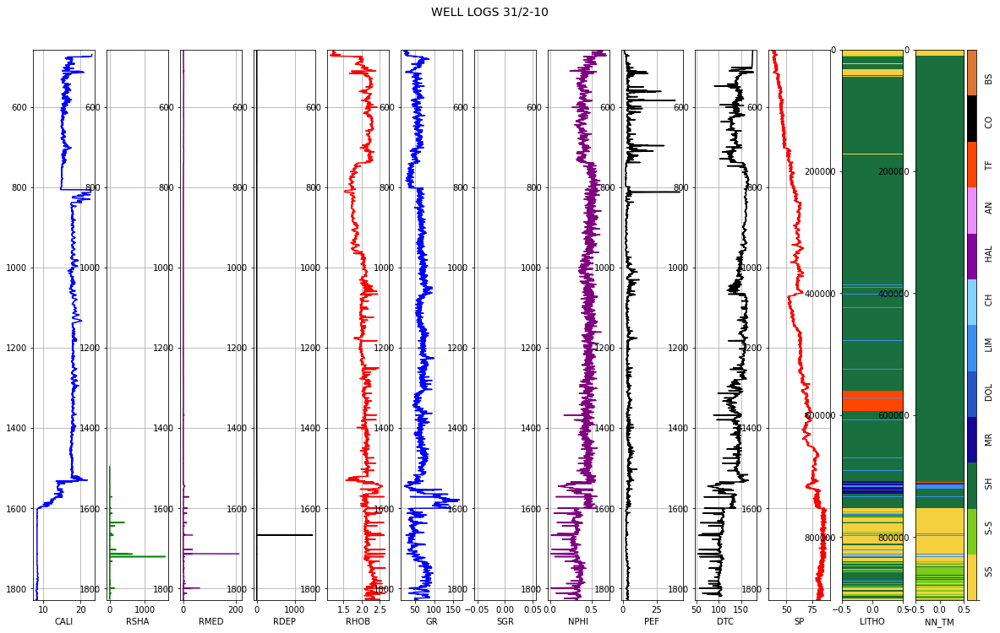

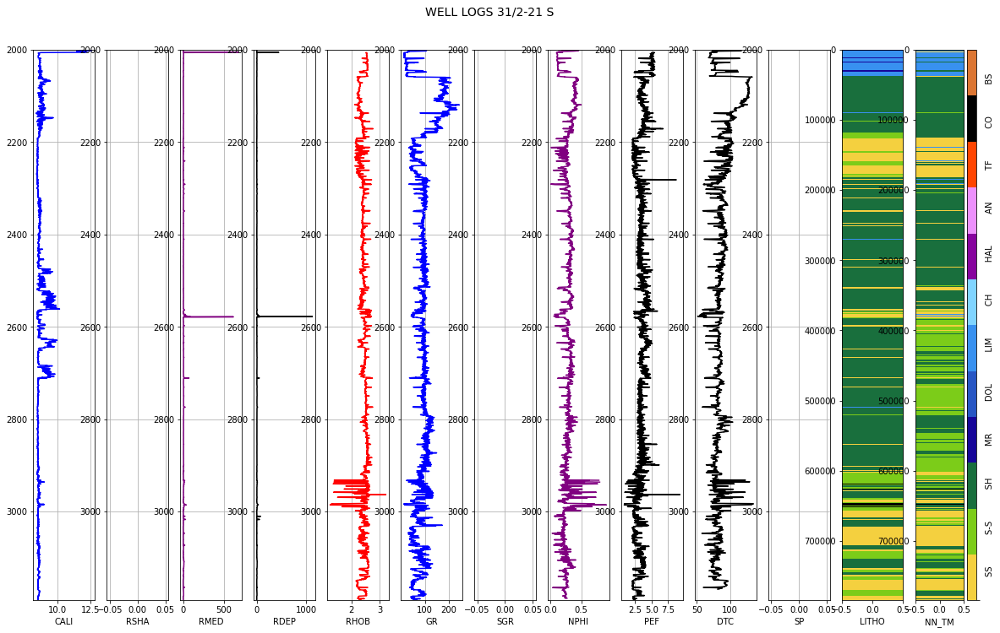

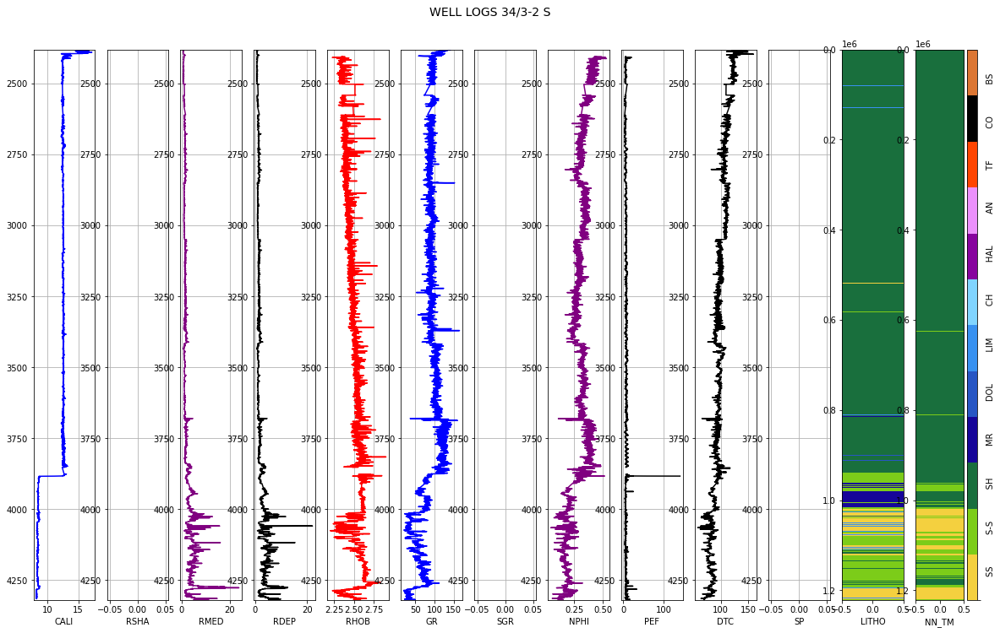

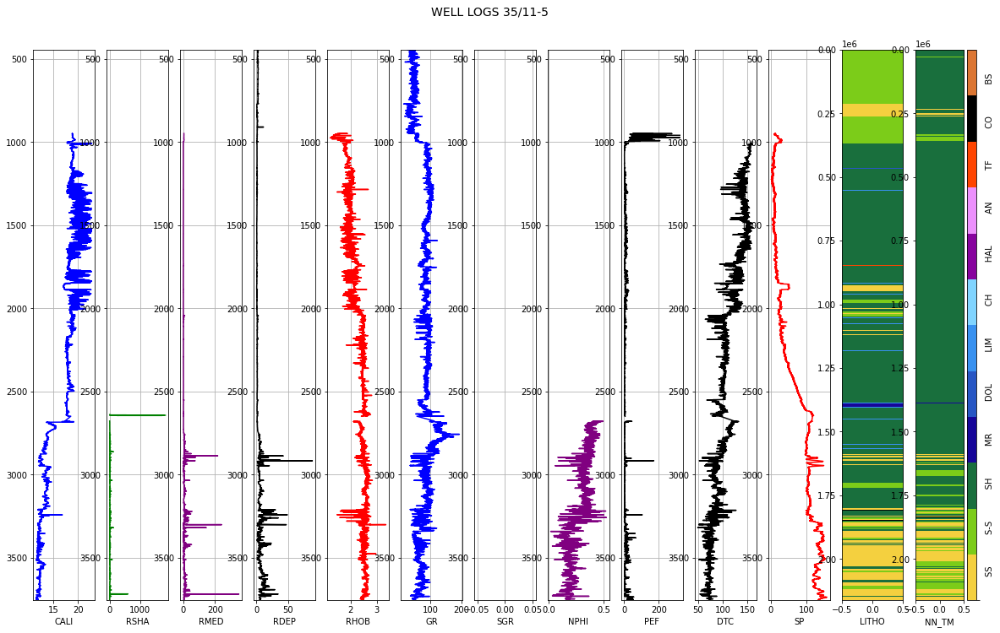

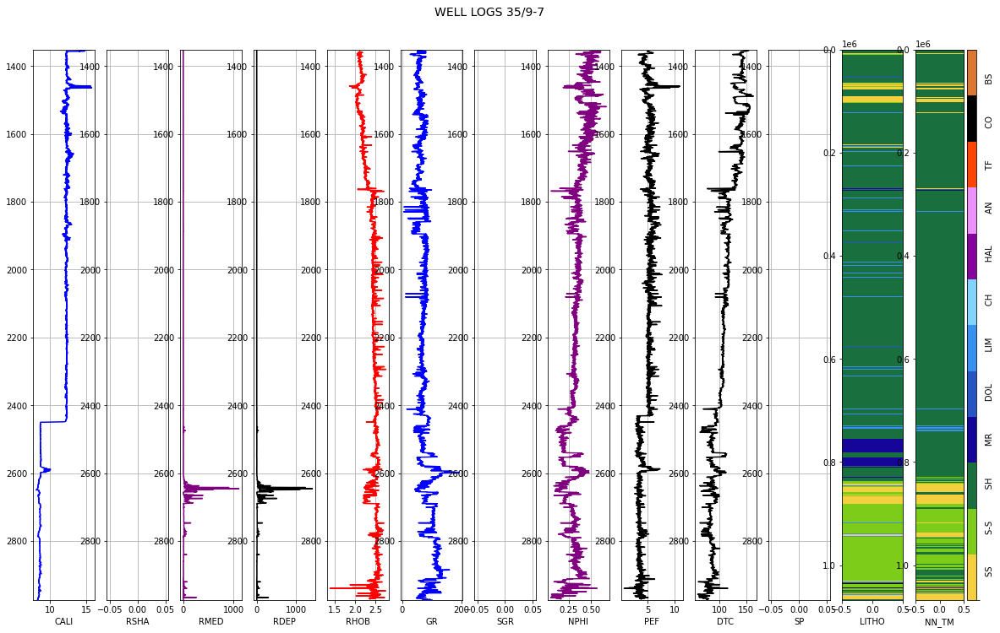

In [ ]:
#Plotting HIDDEN SET results
""" Plotting hidden test set well logs, actual and predicted litholofacies by calling 
litho_prediction customized function. Only the fist well is displayed.

For plotting additionall wells change the range(0, 1).

See litho_prediction.py for further details about the function.
"""

for i in range(0, 10):
  litho_prediction(hidden_nn_res, i, 1)